In [7]:
import torch.nn.functional as F
from torchvision import transforms 
from torch.utils.data import DataLoader
import torch
import matplotlib.pyplot as plt
from torch import nn
import math
from torch.optim import Adam
import tqdm

from functions import *

from IPython.display import display, HTML
from IPython.display import display
display(HTML("<style>.container { width:70% !important; }</style>"))

In [8]:
dataset = torch.load('data/dataset_distlognorm_massnorm.pt')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Diffusion functions

In [3]:
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_loss(model, x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    x_noisy, noise = forward_diffusion_sample(x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod, device)
    
    model.to(device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred), x_noisy

def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod, device="cpu"):
    """ 
    Takes an image and a timestep as input and 
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


@torch.no_grad()
def sample_timestep(model, x, t, betas, sqrt_one_minus_alphas_cumprod, sqrt_recip_alphas, posterior_variance):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t)
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

@torch.no_grad()
def sample_plot_image(model, T, betas, sqrt_one_minus_alphas_cumprod, sqrt_recip_alphas, posterior_variance):
    # Sample noise
    img_size = 64
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(model, img, t, betas, sqrt_one_minus_alphas_cumprod, sqrt_recip_alphas, posterior_variance)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

# MLP model

In [4]:
class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3 
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )
        
        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])
        
        # Edit: Corrected a bug found by Jakub C (see YouTube comment)
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)           
            x = up(x, t)
        return self.output(x)

In [141]:
generator_path = "../notebooks/models/fox_attempt1/generator_fox_test.pt"
encoder_path = "../notebooks/models/fox_attempt1/encoder_fox_test.pt"

saved_generator = torch.load(generator_path, map_location = device)
generator_state_dict = saved_generator["generator"]
latent_dim = saved_generator["latent_space"]
num_branches = saved_generator["num_branches"]
nvar = saved_generator["nvar"]

generator = Generator(nvar, num_branches, latent_dim)
generator.load_state_dict(generator_state_dict)

saved_encoder = torch.load(encoder_path, map_location = device)
encoder_state_dict = saved_encoder["encoder"]

encoder = Encoder(nvar, num_branches, latent_dim)
encoder.load_state_dict(encoder_state_dict)

# freeze encoder and generator
for param in generator.parameters():
    param.requires_grad = False
    
for param in encoder.parameters():
    param.requires_grad = False

In [142]:
def diffusion_train_epoch_latent(model, optimizer, batch, lr, T, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod, device):
    bs = batch.shape[0]

    batch = batch.to(dtype=torch.float32)

    optimizer.zero_grad()

    t = torch.randint(0, T, (bs,), device=device).long()
    loss, batch_noisy = get_loss(model, batch, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
    
    loss.requires_grad = True
    loss.backward()
    optimizer.step()

    return batch_noisy, loss, model

def training_latent_diffusion_latent(encoder, generator, latent_diffusion_model, dataloader,
                              num_epochs, lr, T, device, pretrained = True):
    torch.set_grad_enabled(True)
    
    encoder, generator, latent_diffusion_model = encoder.to(device), generator.to(device), latent_diffusion_model.to(device)
    optimizer = Adam(latent_diffusion_model.parameters(), lr = lr)
    
    transform = transforms.Resize((64, 64))
    transform_back = transforms.Resize((10, 10))
    
    betas = linear_beta_schedule(timesteps=T)
    # Pre-calculate different terms for closed form
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

    for epoch in range(num_epochs):
        print(f"Epoch: {epoch + 1} / {num_epochs}")
        
        
        for batch in tqdm.tqdm(dataloader):
            # (bs, 3, 29, 10)
            #print("should be (bs, 3, 29, 10):", batch.shape)
            batch = batch.to(dtype=torch.float32).to(device)
            
            # run through encoder
            # (bs, 300)
            latent_representation = encoder(batch)
            
            #run through diffusion
            # (bs, 3, 64, 64)
            latent_diffused, loss, latent_diffusion_model = diffusion_train_epoch_latent(latent_diffusion_model,
                                                                                          optimizer,
                                                                                          latent_representation,
                                                                                          lr,
                                                                                          T,
                                                                                          sqrt_alphas_cumprod,
                                                                                          sqrt_one_minus_alphas_cumprod,
                                                                                          device)
            
            #run through generator
            output = generator(latent_diffused)
            #print("should be (bs, 3, 29, 10):", output.shape)
            
        print(f"Epoch {epoch + 1} | Loss: {loss.item()} ")
        
        plt.imshow(batch[0].detach().permute(1, 2, 0))
        plt.axis('off')  # Optional: Turn off axis ticks and labels
        plt.show()

        plt.imshow(latent_representation[:10].detach())
        plt.axis('off')  # Optional: Turn off axis ticks and labels
        plt.show()

        plt.imshow(latent_diffused[:10].detach())
        plt.axis('off')  # Optional: Turn off axis ticks and labels
        plt.show()

        plt.imshow(output[0].detach().permute(1, 2, 0))
        plt.axis('off')  # Optional: Turn off axis ticks and labels
        plt.show()
        
    return encoder, generator, latent_diffusion_model

In [148]:
def get_loss(model, x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    x_noisy, noise = forward_diffusion_sample(x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod, device)
    
    model.to(device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise_pred, noise), x_noisy

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings

class LatentDiffusionModel(nn.Module):
    def __init__(self, input_size = 300, hidden_size = 128, output_size = 300):
        super(LatentDiffusionModel, self).__init__()
        self.time_emb_dim = hidden_size

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(self.time_emb_dim),
                nn.Linear(self.time_emb_dim, self.time_emb_dim),
                nn.ReLU()
            )
        
        
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        
        # Define MLP layers
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size * 2, hidden_size * 3)
        self.fc3 = nn.Linear(hidden_size * 3, hidden_size * 4)
        self.fc4 = nn.Linear(hidden_size * 4, hidden_size * 3)
        self.fc5 = nn.Linear(hidden_size * 3, hidden_size * 2)
        self.fc6 = nn.Linear(hidden_size * 2, hidden_size)
        self.fc7 = nn.Linear(hidden_size, output_size)
        self.relu = nn.ReLU()
    
    def forward(self, x, t):
        print("input:", x.shape)
        time_emb = self.time_mlp(t)
        print("t:", t.shape)
        print("time_emb:", time_emb.shape)
        x0 = self.relu(self.fc1(x))
        print("x0:", x0.shape)
        x1 = torch.cat([x0, time_emb], dim = 1)
        print("x1:", x1.shape)
        x2 = self.relu(self.fc2(x1))
        x3 = self.relu(self.fc3(x2))
        x4 = self.relu(self.fc4(x3)) + x2
        x5 = self.relu(self.fc5(x4)) + x1
        x6 = self.relu(self.fc6(x5)) + x0
        x7 = self.fc7(x6)
        return x

Epoch: 1 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 1 | Loss: 1.656105399131775 


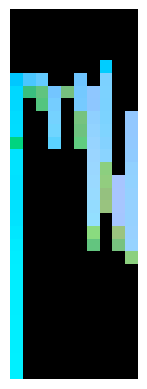

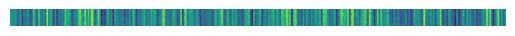

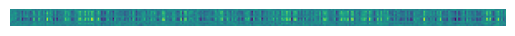

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


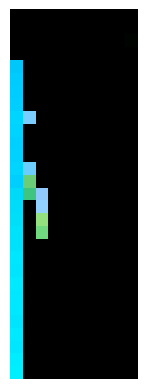

Epoch: 2 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 2 | Loss: 1.5463190078735352 


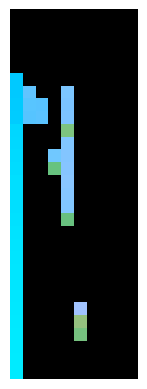

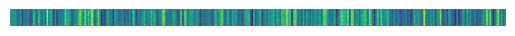

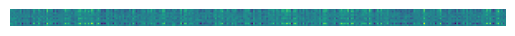

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


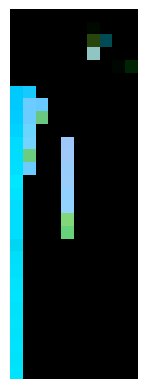

Epoch: 3 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 3 | Loss: 1.3811575174331665 


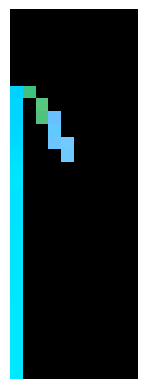

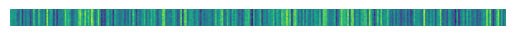

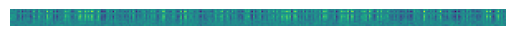

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


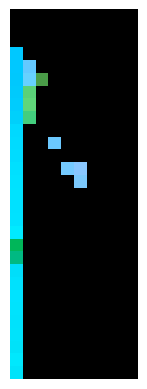

Epoch: 4 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 4 | Loss: 1.7880773544311523 


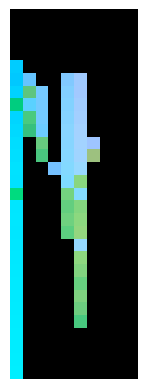

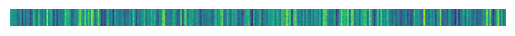

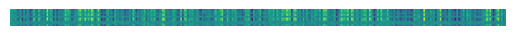

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


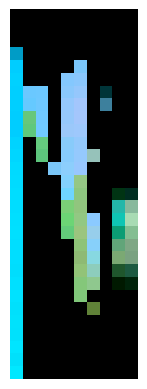

Epoch: 5 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.25it/s]

Epoch 5 | Loss: 1.5891894102096558 


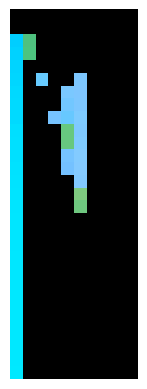

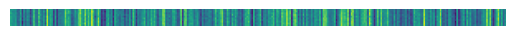

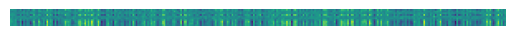

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


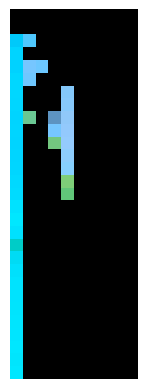

Epoch: 6 / 200


100%|█████████████████████████████████████████| 300/300 [02:14<00:00,  2.23it/s]

Epoch 6 | Loss: 1.5112074613571167 


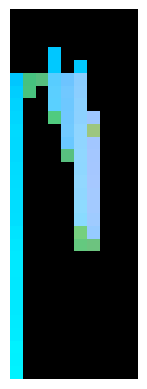

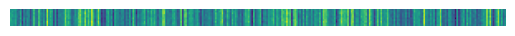

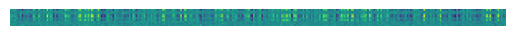

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


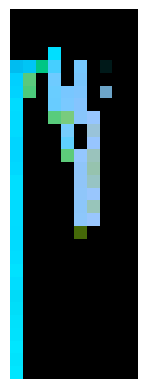

Epoch: 7 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.24it/s]

Epoch 7 | Loss: 1.6122819185256958 


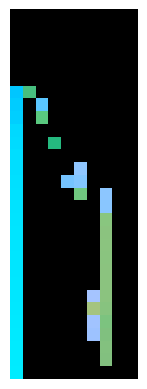

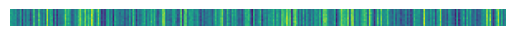

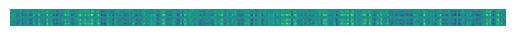

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


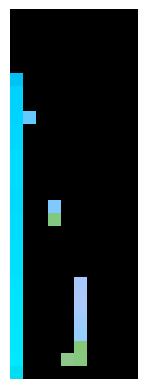

Epoch: 8 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.24it/s]

Epoch 8 | Loss: 1.6271660327911377 


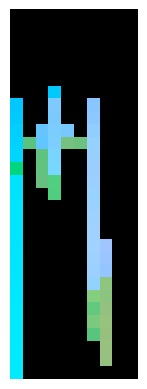

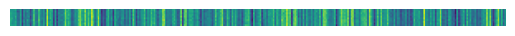

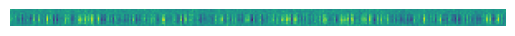

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


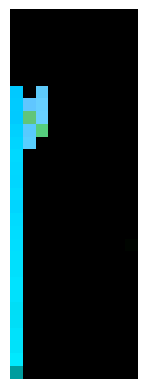

Epoch: 9 / 200


100%|█████████████████████████████████████████| 300/300 [02:14<00:00,  2.23it/s]

Epoch 9 | Loss: 1.6105878353118896 


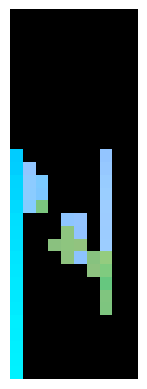

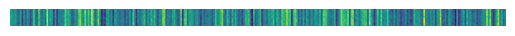

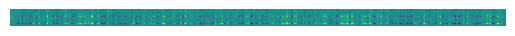

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


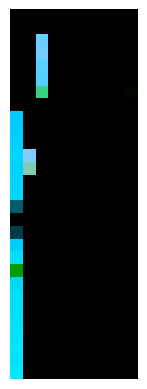

Epoch: 10 / 200


100%|█████████████████████████████████████████| 300/300 [02:15<00:00,  2.22it/s]

Epoch 10 | Loss: 1.7181799411773682 


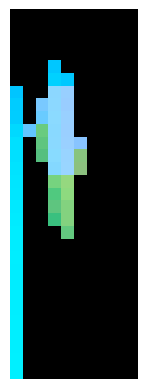

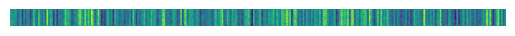

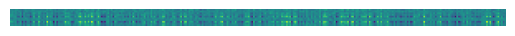

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


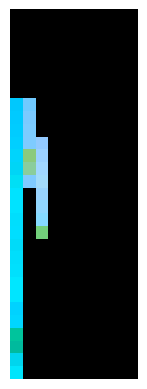

Epoch: 11 / 200


100%|█████████████████████████████████████████| 300/300 [02:14<00:00,  2.23it/s]

Epoch 11 | Loss: 1.5890676975250244 


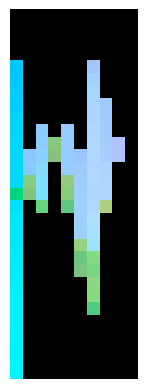

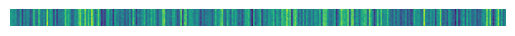

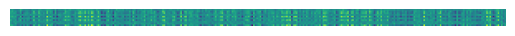

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


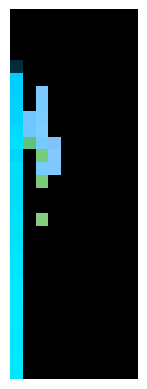

Epoch: 12 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.24it/s]

Epoch 12 | Loss: 1.6181515455245972 


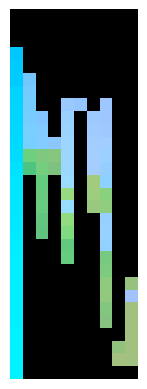

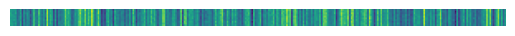

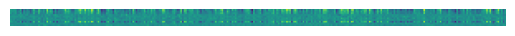

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


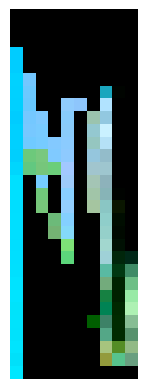

Epoch: 13 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.25it/s]

Epoch 13 | Loss: 1.3499655723571777 


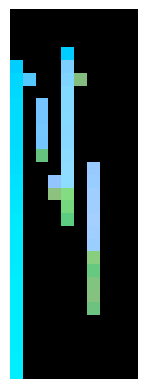

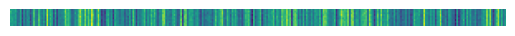

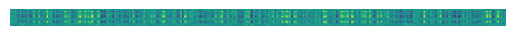

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


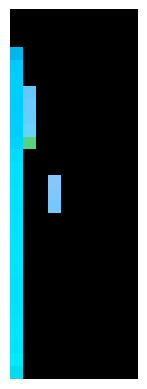

Epoch: 14 / 200


100%|█████████████████████████████████████████| 300/300 [02:14<00:00,  2.24it/s]

Epoch 14 | Loss: 1.637807011604309 


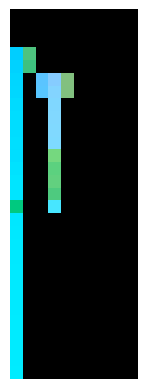

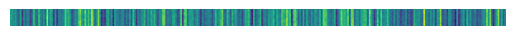

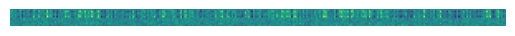

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


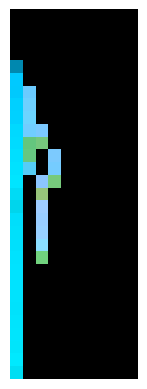

Epoch: 15 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 15 | Loss: 1.55118727684021 


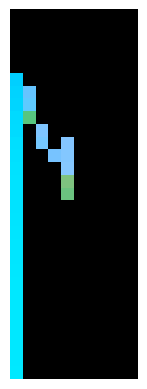

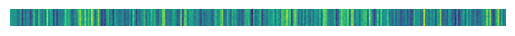

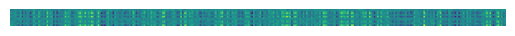

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


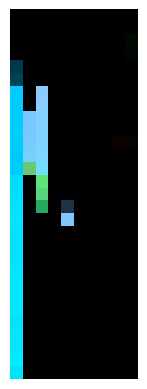

Epoch: 16 / 200


100%|█████████████████████████████████████████| 300/300 [02:15<00:00,  2.21it/s]

Epoch 16 | Loss: 1.3338567018508911 


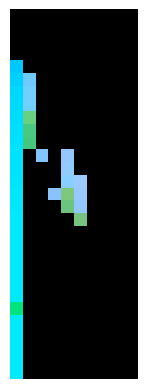

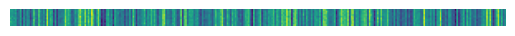

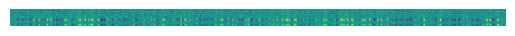

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


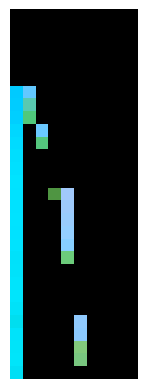

Epoch: 17 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.19it/s]

Epoch 17 | Loss: 1.7640632390975952 


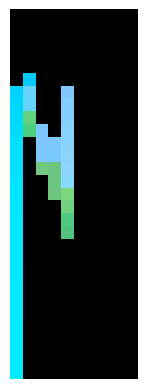

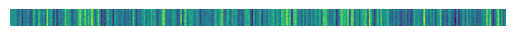

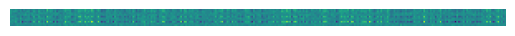

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


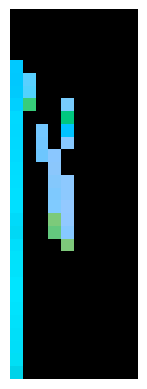

Epoch: 18 / 200


100%|█████████████████████████████████████████| 300/300 [02:15<00:00,  2.21it/s]

Epoch 18 | Loss: 1.4169594049453735 


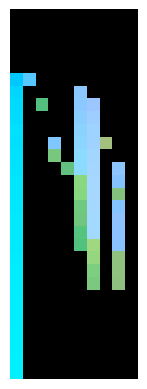

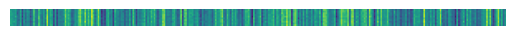

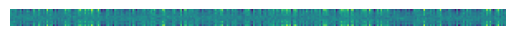

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


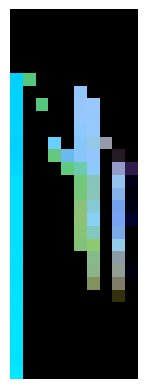

Epoch: 19 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.24it/s]

Epoch 19 | Loss: 1.5671734809875488 


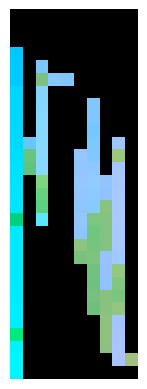

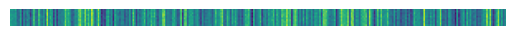

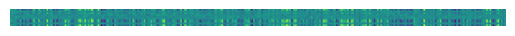

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


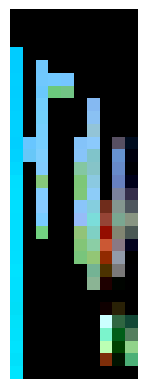

Epoch: 20 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 20 | Loss: 1.5826057195663452 


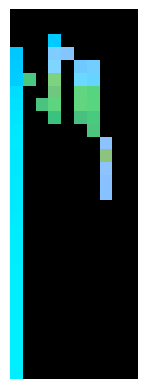

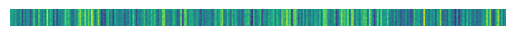

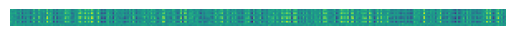

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


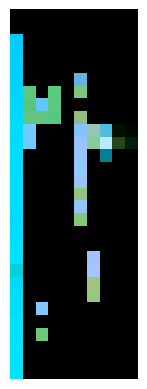

Epoch: 21 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 21 | Loss: 1.5769869089126587 


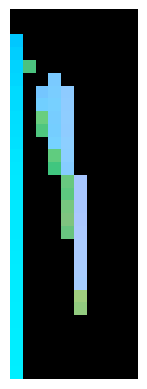

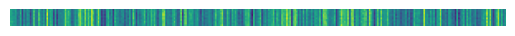

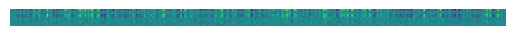

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


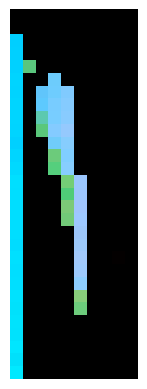

Epoch: 22 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 22 | Loss: 1.4854620695114136 


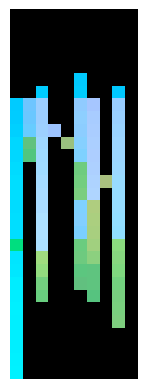

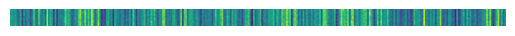

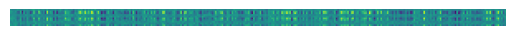

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


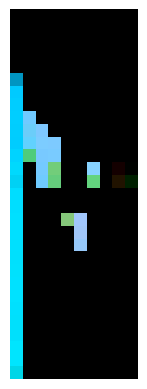

Epoch: 23 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 23 | Loss: 1.35385262966156 


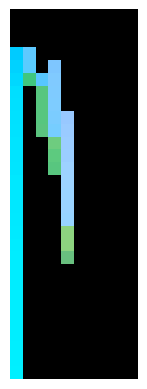

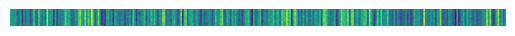

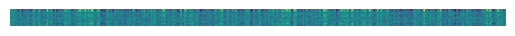

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


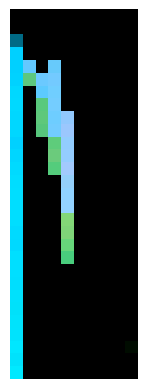

Epoch: 24 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.26it/s]

Epoch 24 | Loss: 1.476702332496643 


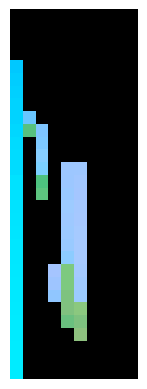

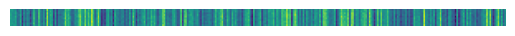

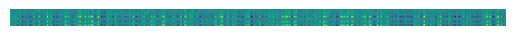

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


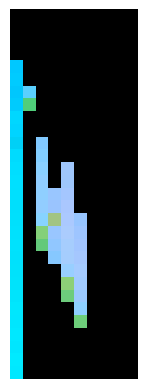

Epoch: 25 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 25 | Loss: 1.3890291452407837 


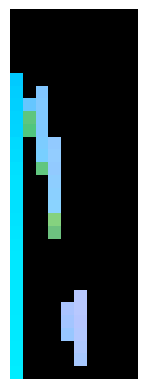

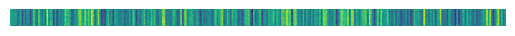

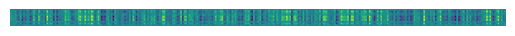

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


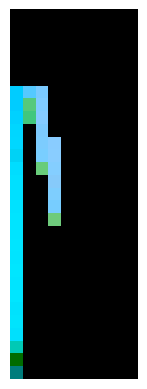

Epoch: 26 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 26 | Loss: 1.5154123306274414 


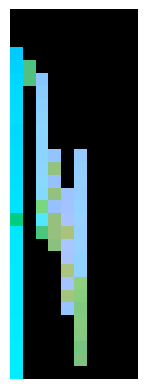

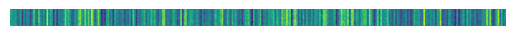

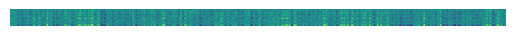

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


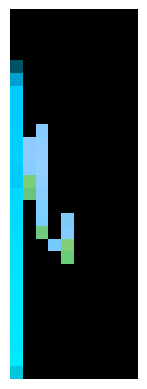

Epoch: 27 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.24it/s]

Epoch 27 | Loss: 1.6031426191329956 


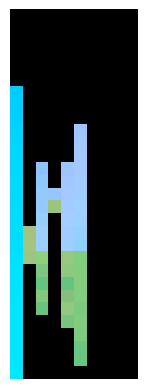

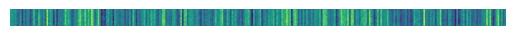

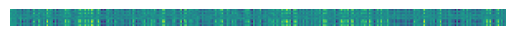

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


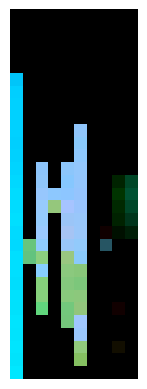

Epoch: 28 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 28 | Loss: 1.5219018459320068 


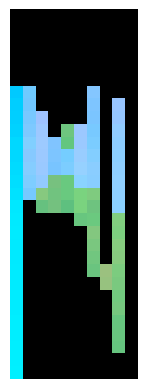

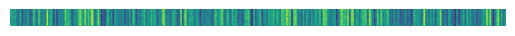

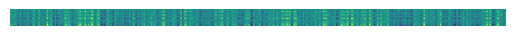

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


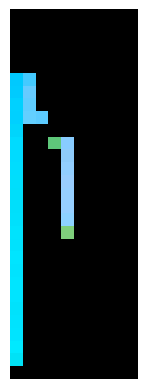

Epoch: 29 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 29 | Loss: 1.8030794858932495 


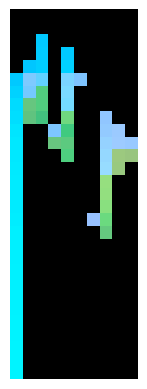

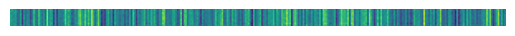

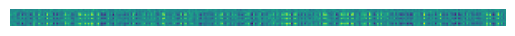

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


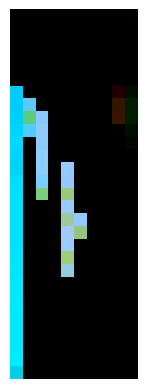

Epoch: 30 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.19it/s]

Epoch 30 | Loss: 1.5992375612258911 


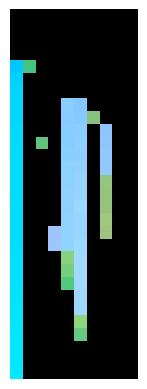

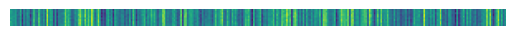

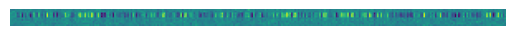

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


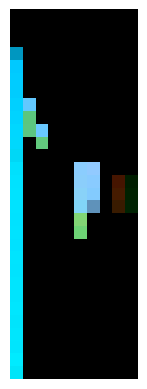

Epoch: 31 / 200


100%|█████████████████████████████████████████| 300/300 [02:19<00:00,  2.16it/s]

Epoch 31 | Loss: 1.671661138534546 


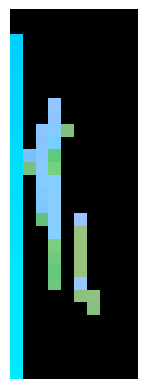

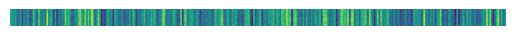

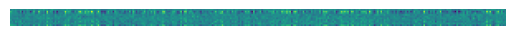

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


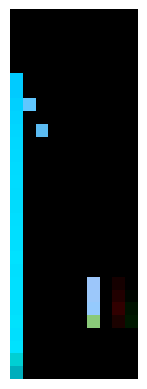

Epoch: 32 / 200


100%|█████████████████████████████████████████| 300/300 [02:18<00:00,  2.16it/s]

Epoch 32 | Loss: 1.4548728466033936 


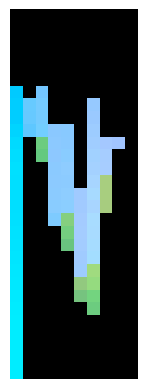

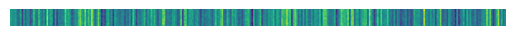

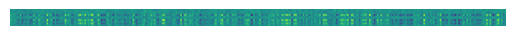

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


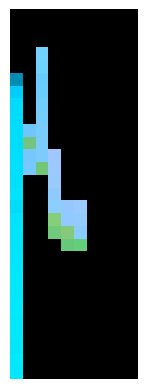

Epoch: 33 / 200


100%|█████████████████████████████████████████| 300/300 [02:19<00:00,  2.14it/s]

Epoch 33 | Loss: 1.690920352935791 


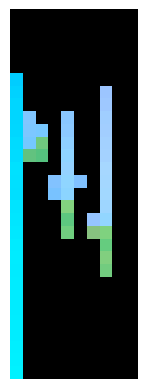

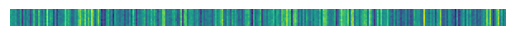

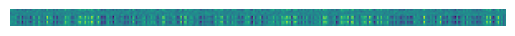

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


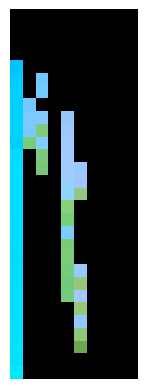

Epoch: 34 / 200


100%|█████████████████████████████████████████| 300/300 [02:20<00:00,  2.14it/s]

Epoch 34 | Loss: 1.7005233764648438 


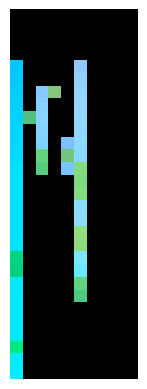

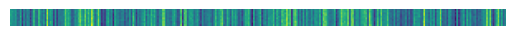

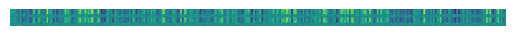

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


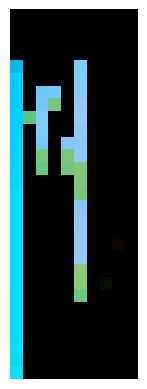

Epoch: 35 / 200


100%|█████████████████████████████████████████| 300/300 [02:20<00:00,  2.13it/s]

Epoch 35 | Loss: 1.4862701892852783 


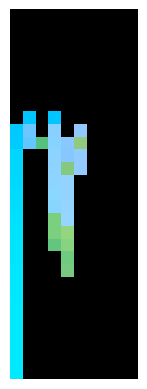

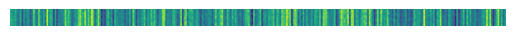

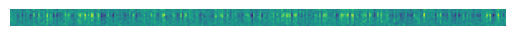

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


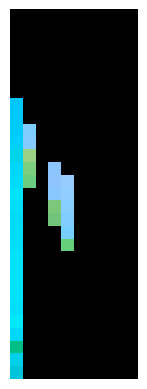

Epoch: 36 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 36 | Loss: 1.669215440750122 


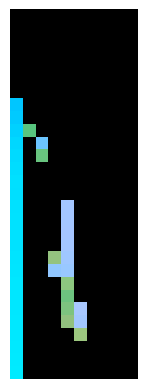

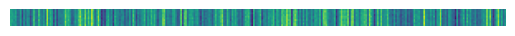

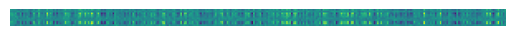

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


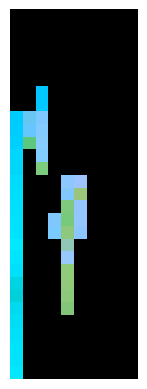

Epoch: 37 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 37 | Loss: 1.6677460670471191 


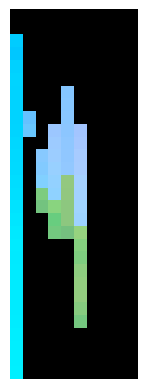

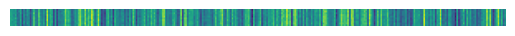

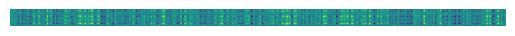

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


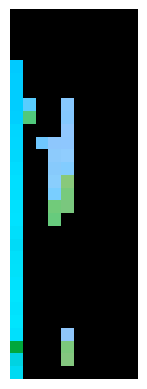

Epoch: 38 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 38 | Loss: 1.3258748054504395 


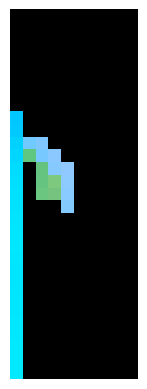

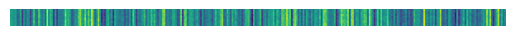

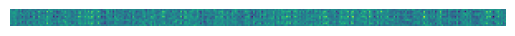

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


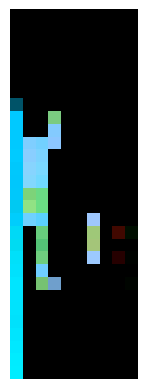

Epoch: 39 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 39 | Loss: 1.7274972200393677 


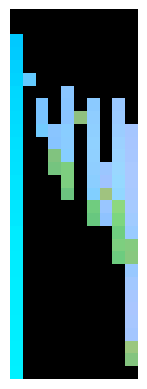

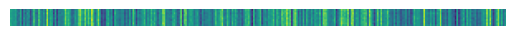

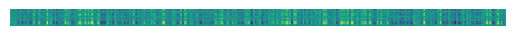

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


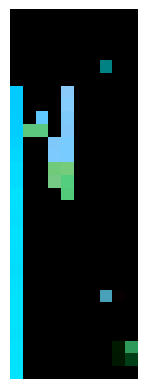

Epoch: 40 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.11it/s]

Epoch 40 | Loss: 1.5757769346237183 


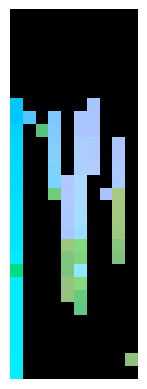

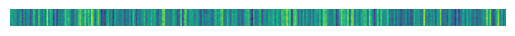

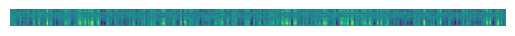

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


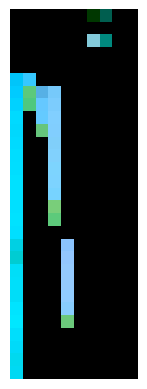

Epoch: 41 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.10it/s]

Epoch 41 | Loss: 1.663177251815796 


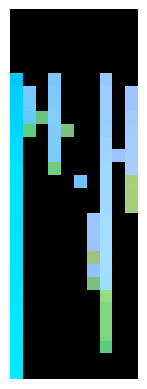

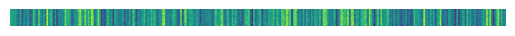

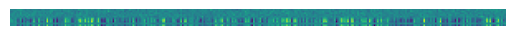

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


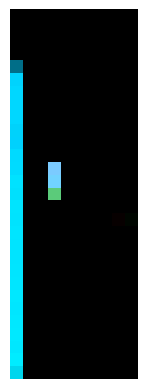

Epoch: 42 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.09it/s]

Epoch 42 | Loss: 1.5694612264633179 


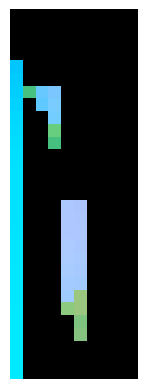

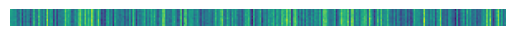

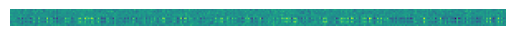

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


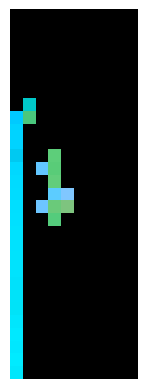

Epoch: 43 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.09it/s]

Epoch 43 | Loss: 1.8130983114242554 


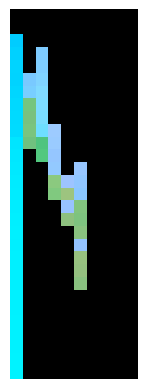

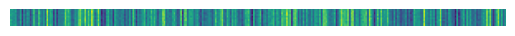

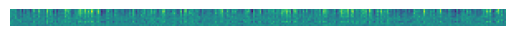

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


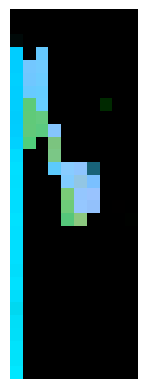

Epoch: 44 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.10it/s]

Epoch 44 | Loss: 1.661190390586853 


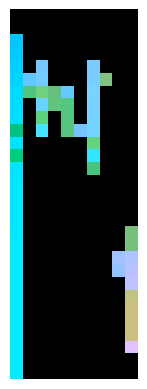

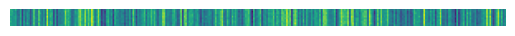

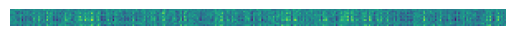

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


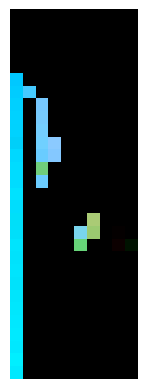

Epoch: 45 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 45 | Loss: 1.6308112144470215 


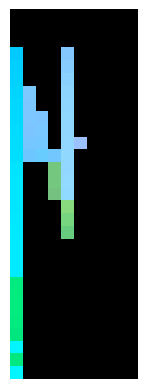

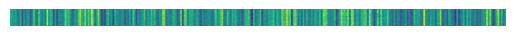

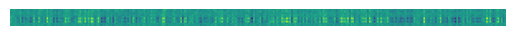

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


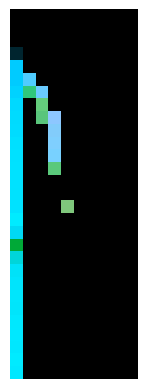

Epoch: 46 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.10it/s]

Epoch 46 | Loss: 1.651500940322876 


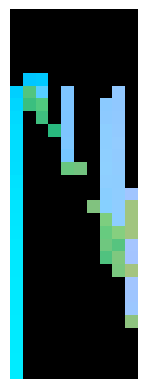

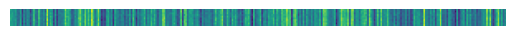

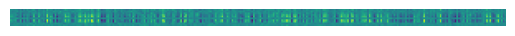

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


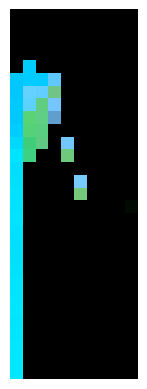

Epoch: 47 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.10it/s]

Epoch 47 | Loss: 1.6207599639892578 


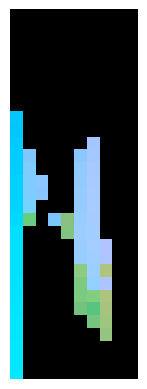

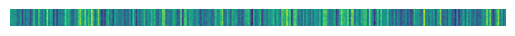

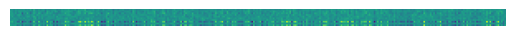

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


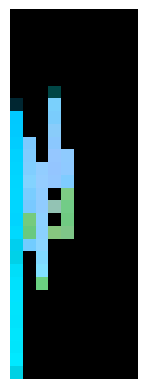

Epoch: 48 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.09it/s]

Epoch 48 | Loss: 1.8637229204177856 


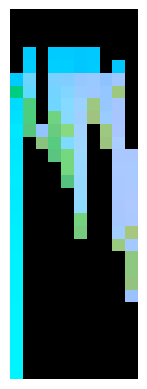

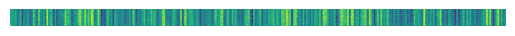

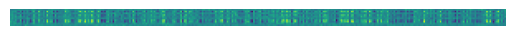

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


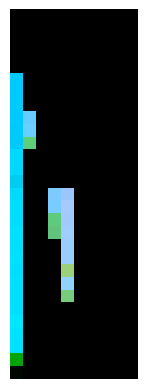

Epoch: 49 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.09it/s]

Epoch 49 | Loss: 1.3506038188934326 


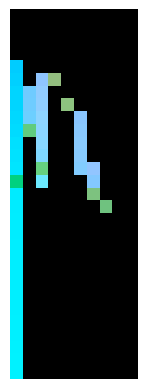

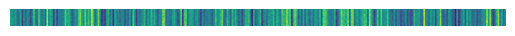

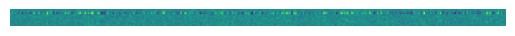

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


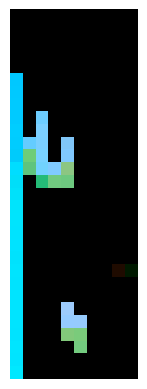

Epoch: 50 / 200


100%|█████████████████████████████████████████| 300/300 [02:24<00:00,  2.08it/s]

Epoch 50 | Loss: 1.6146652698516846 


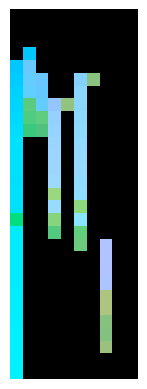

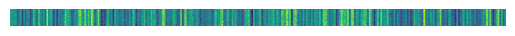

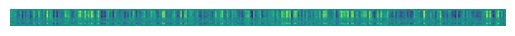

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


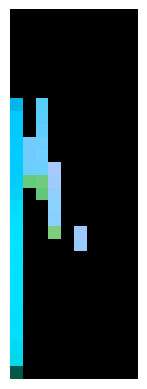

Epoch: 51 / 200


100%|█████████████████████████████████████████| 300/300 [02:24<00:00,  2.08it/s]

Epoch 51 | Loss: 1.3966811895370483 


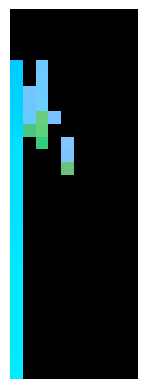

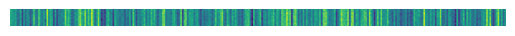

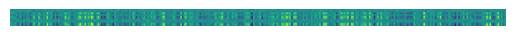

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


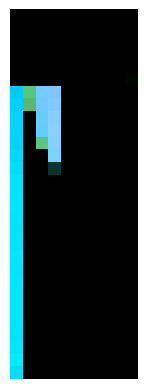

Epoch: 52 / 200


100%|█████████████████████████████████████████| 300/300 [02:24<00:00,  2.08it/s]

Epoch 52 | Loss: 1.804297685623169 


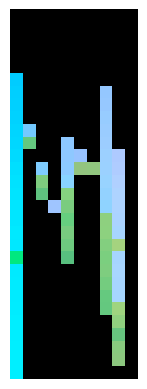

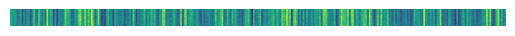

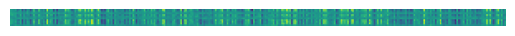

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


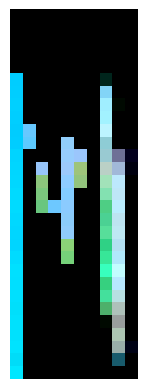

Epoch: 53 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.09it/s]

Epoch 53 | Loss: 1.500425934791565 


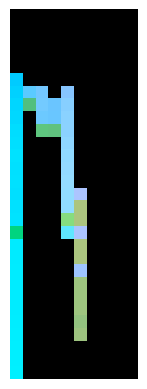

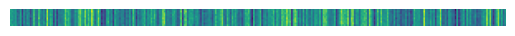

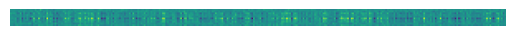

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


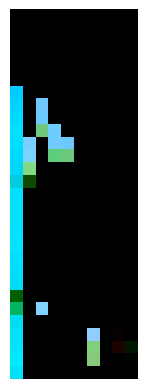

Epoch: 54 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.10it/s]

Epoch 54 | Loss: 1.6501036882400513 


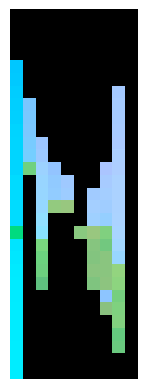

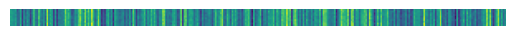

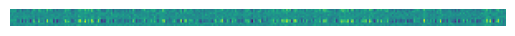

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


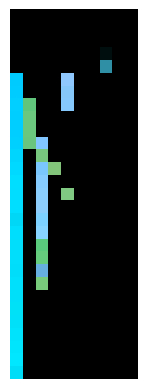

Epoch: 55 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.10it/s]

Epoch 55 | Loss: 1.599266767501831 


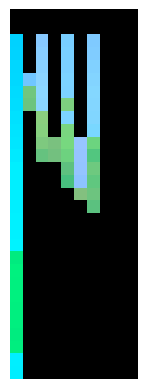

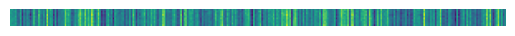

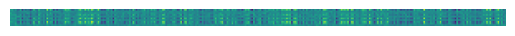

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


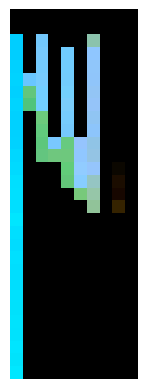

Epoch: 56 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.10it/s]

Epoch 56 | Loss: 1.7381927967071533 


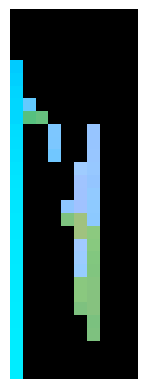

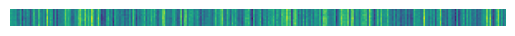

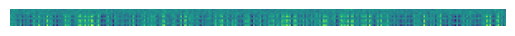

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


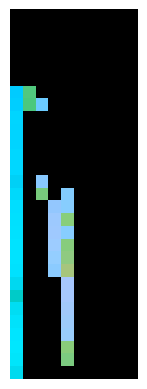

Epoch: 57 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 57 | Loss: 1.7563912868499756 


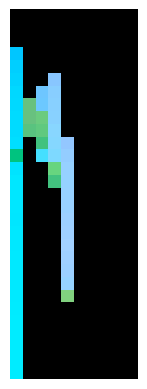

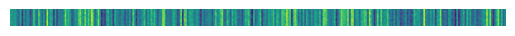

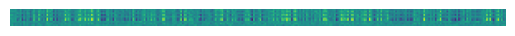

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


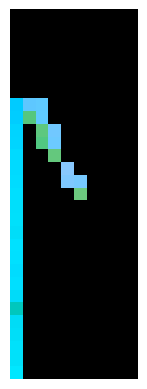

Epoch: 58 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.10it/s]

Epoch 58 | Loss: 1.5779341459274292 


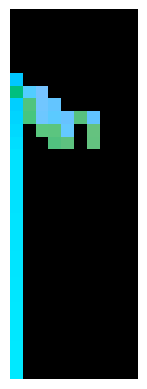

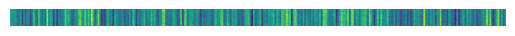

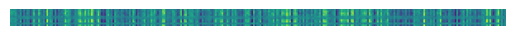

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


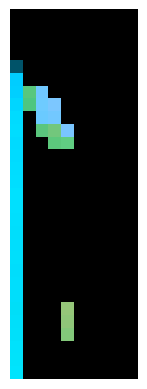

Epoch: 59 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.10it/s]

Epoch 59 | Loss: 1.439589023590088 


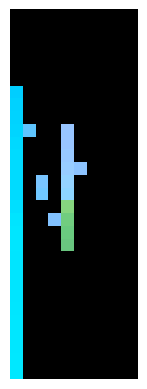

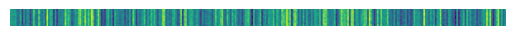

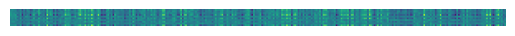

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


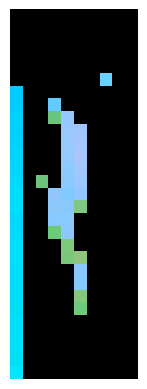

Epoch: 60 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.09it/s]

Epoch 60 | Loss: 1.5065648555755615 


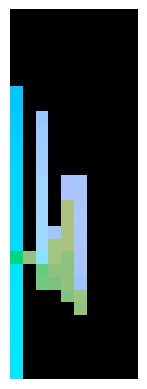

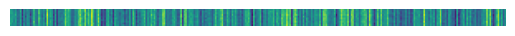

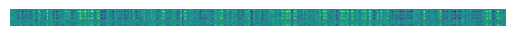

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


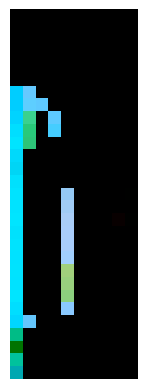

Epoch: 61 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.08it/s]

Epoch 61 | Loss: 1.7329596281051636 


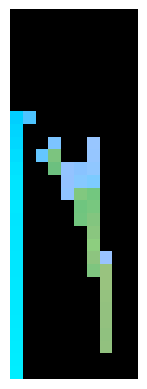

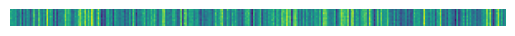

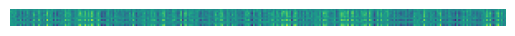

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


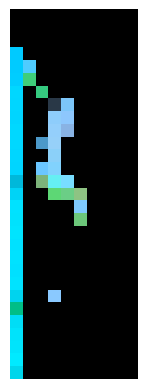

Epoch: 62 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.09it/s]

Epoch 62 | Loss: 1.6376242637634277 


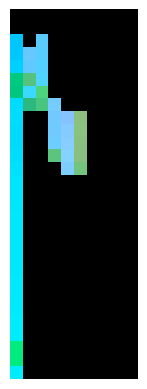

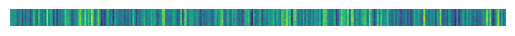

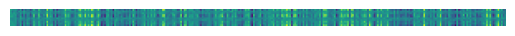

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


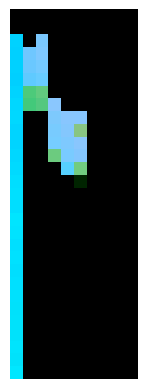

Epoch: 63 / 200


100%|█████████████████████████████████████████| 300/300 [02:24<00:00,  2.08it/s]

Epoch 63 | Loss: 1.4870154857635498 


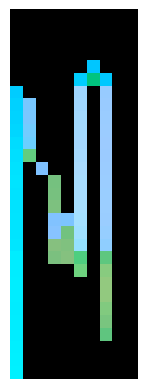

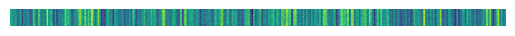

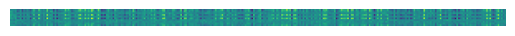

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


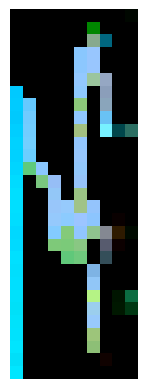

Epoch: 64 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.09it/s]

Epoch 64 | Loss: 1.7940970659255981 


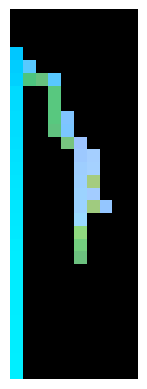

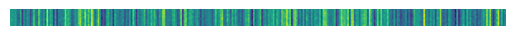

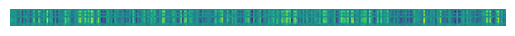

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


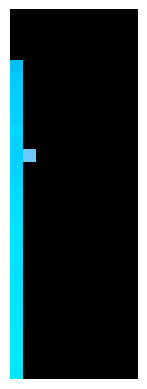

Epoch: 65 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.09it/s]

Epoch 65 | Loss: 1.6082202196121216 


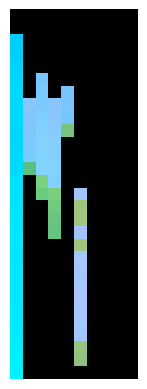

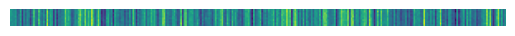

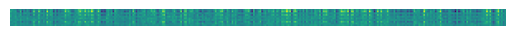

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


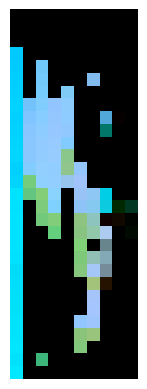

Epoch: 66 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.10it/s]

Epoch 66 | Loss: 1.6494020223617554 


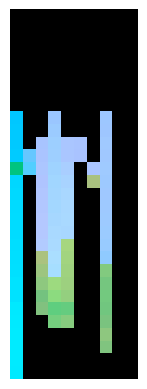

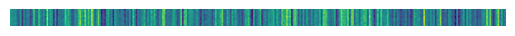

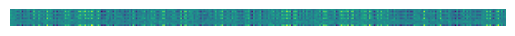

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


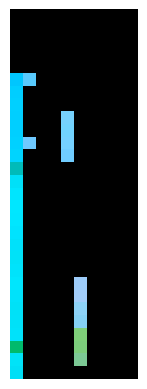

Epoch: 67 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.09it/s]

Epoch 67 | Loss: 1.6202688217163086 


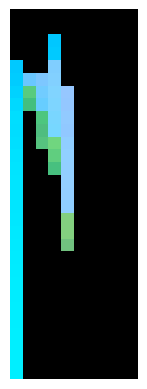

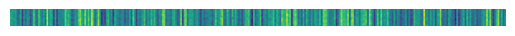

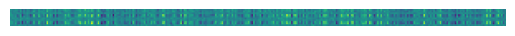

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


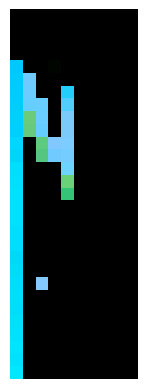

Epoch: 68 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 68 | Loss: 1.4675073623657227 


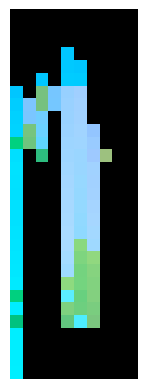

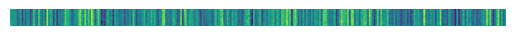

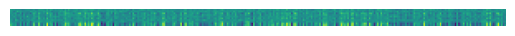

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


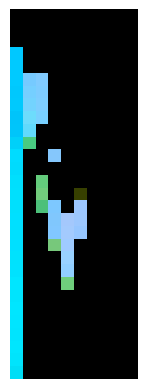

Epoch: 69 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.13it/s]

Epoch 69 | Loss: 1.6076730489730835 


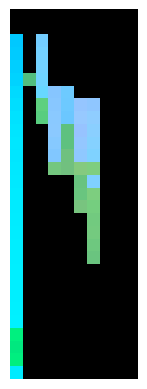

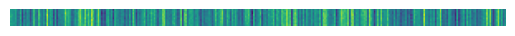

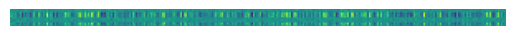

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


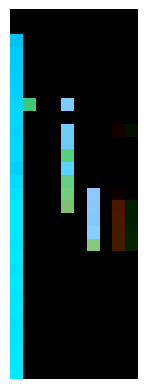

Epoch: 70 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 70 | Loss: 1.5566577911376953 


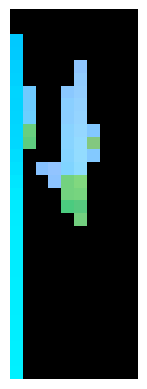

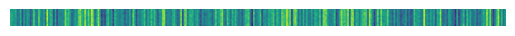

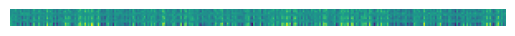

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


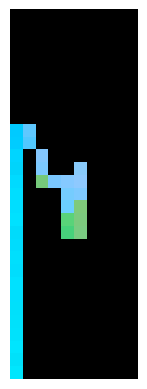

Epoch: 71 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 71 | Loss: 1.701589584350586 


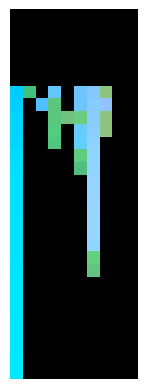

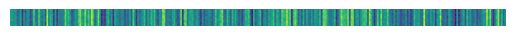

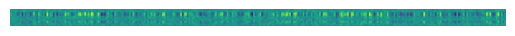

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


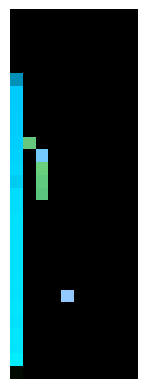

Epoch: 72 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.11it/s]

Epoch 72 | Loss: 1.8281285762786865 


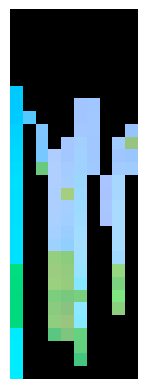

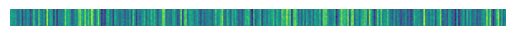

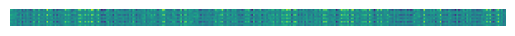

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


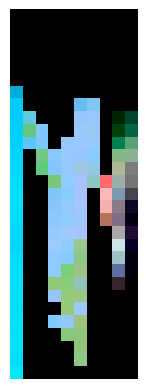

Epoch: 73 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 73 | Loss: 1.3804938793182373 


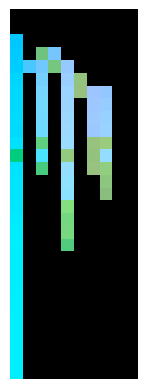

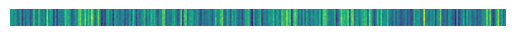

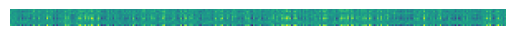

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


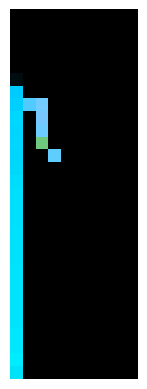

Epoch: 74 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 74 | Loss: 1.6045655012130737 


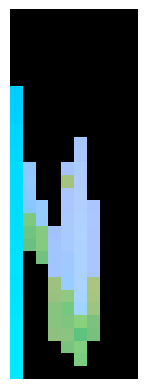

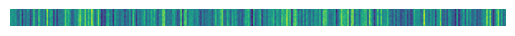

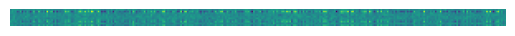

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


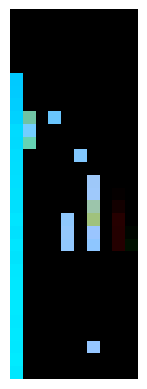

Epoch: 75 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]


Epoch 75 | Loss: 1.4356414079666138 


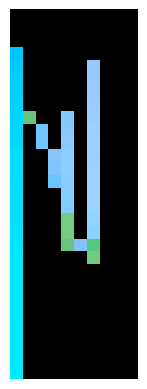

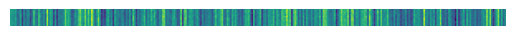

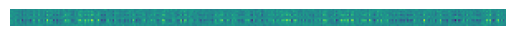

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


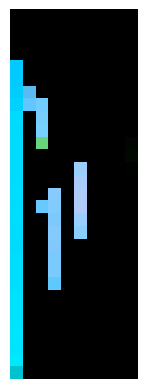

Epoch: 76 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 76 | Loss: 1.541976809501648 


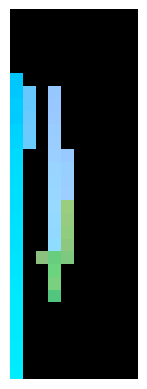

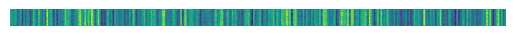

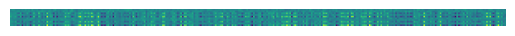

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


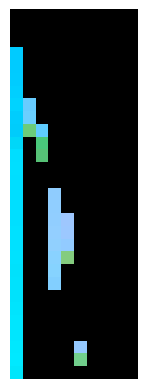

Epoch: 77 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 77 | Loss: 1.3775275945663452 


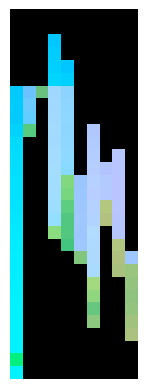

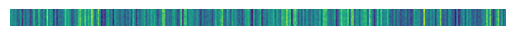

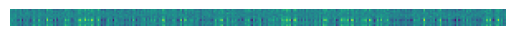

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


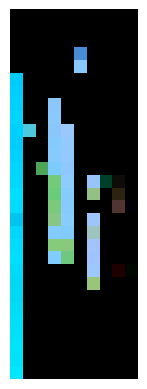

Epoch: 78 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 78 | Loss: 1.5017423629760742 


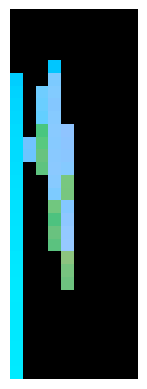

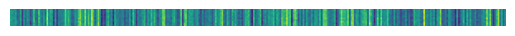

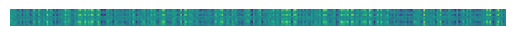

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


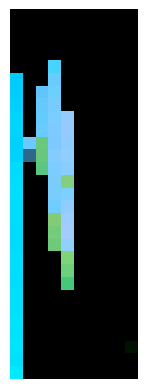

Epoch: 79 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 79 | Loss: 1.9724607467651367 


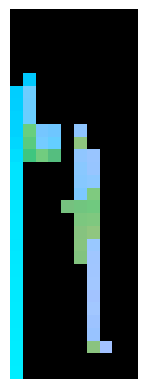

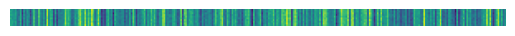

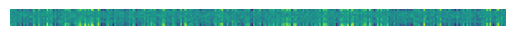

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


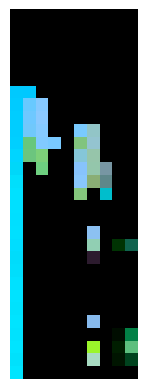

Epoch: 80 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 80 | Loss: 1.735283374786377 


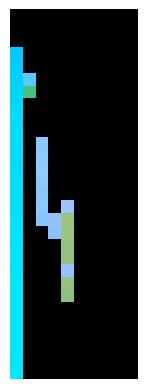

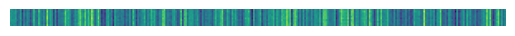

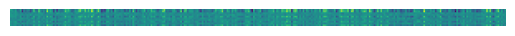

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


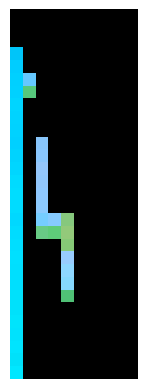

Epoch: 81 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 81 | Loss: 1.4331260919570923 


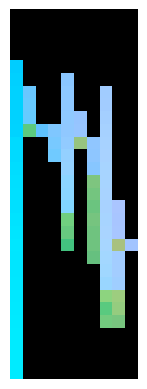

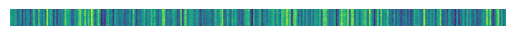

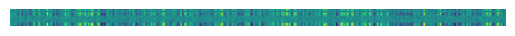

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


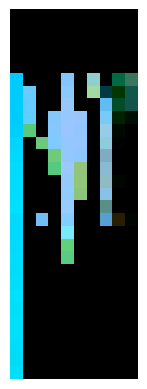

Epoch: 82 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 82 | Loss: 1.8570711612701416 


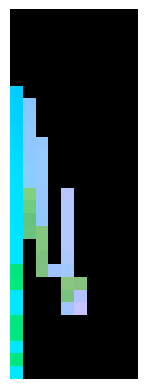

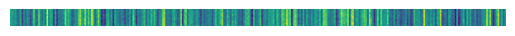

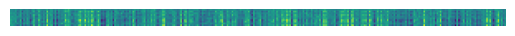

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


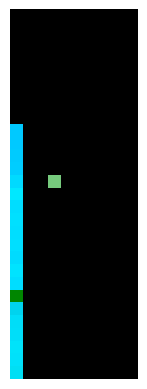

Epoch: 83 / 200


100%|█████████████████████████████████████████| 300/300 [02:27<00:00,  2.03it/s]

Epoch 83 | Loss: 1.4161714315414429 


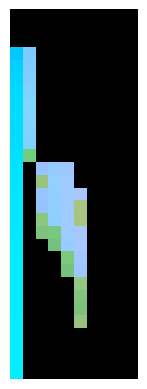

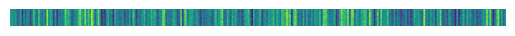

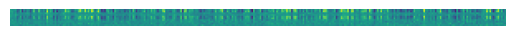

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


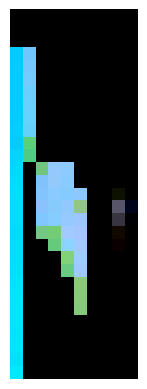

Epoch: 84 / 200


100%|█████████████████████████████████████████| 300/300 [02:20<00:00,  2.13it/s]

Epoch 84 | Loss: 1.6371136903762817 


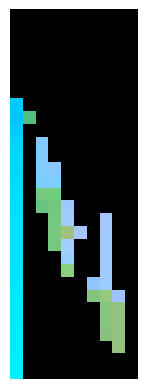

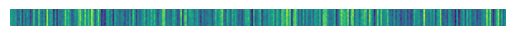

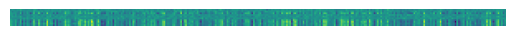

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


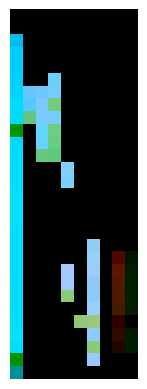

Epoch: 85 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 85 | Loss: 1.518471121788025 


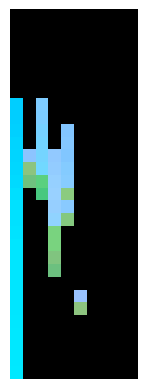

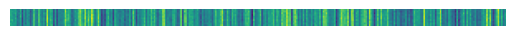

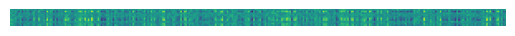

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


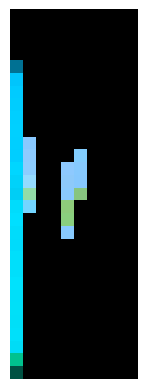

Epoch: 86 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 86 | Loss: 1.4419671297073364 


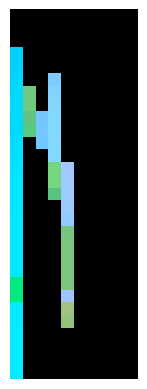

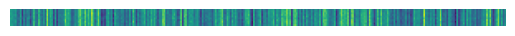

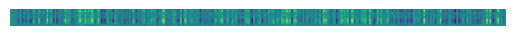

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


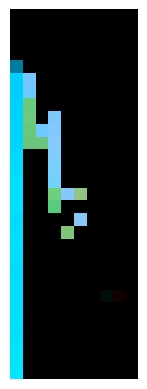

Epoch: 87 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 87 | Loss: 1.6382697820663452 


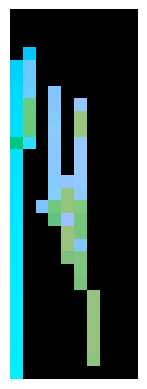

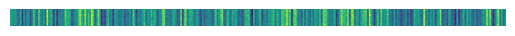

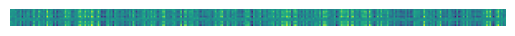

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


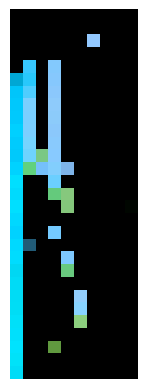

Epoch: 88 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.08it/s]

Epoch 88 | Loss: 1.7574503421783447 


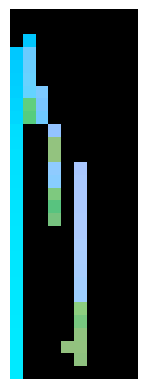

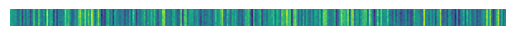

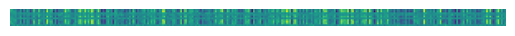

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


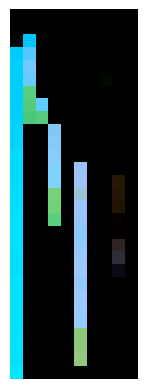

Epoch: 89 / 200


100%|█████████████████████████████████████████| 300/300 [02:23<00:00,  2.10it/s]

Epoch 89 | Loss: 1.6495739221572876 


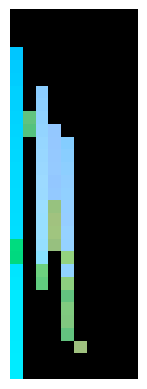

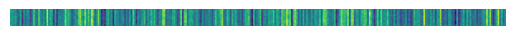

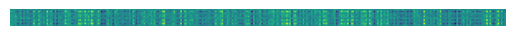

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


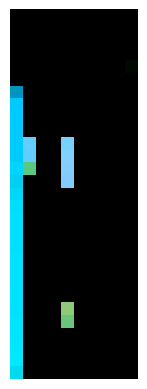

Epoch: 90 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.10it/s]

Epoch 90 | Loss: 1.620388388633728 


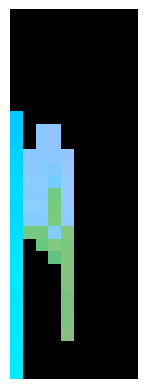

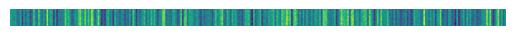

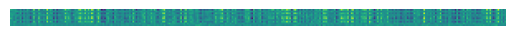

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


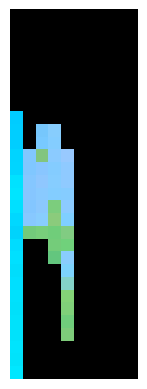

Epoch: 91 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 91 | Loss: 1.2863510847091675 


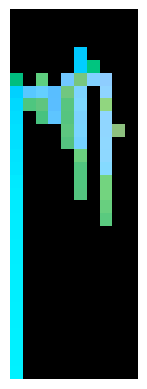

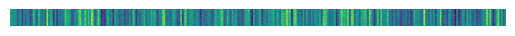

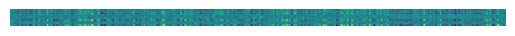

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


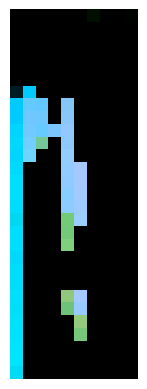

Epoch: 92 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 92 | Loss: 1.605678915977478 


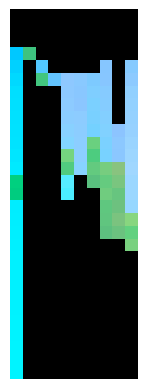

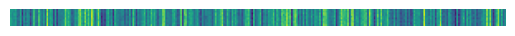

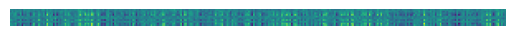

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


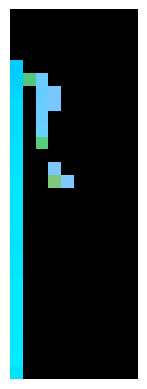

Epoch: 93 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 93 | Loss: 1.4233201742172241 


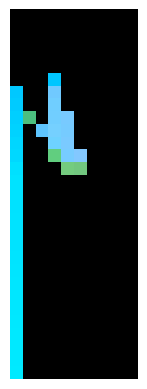

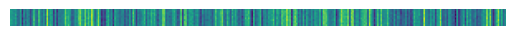

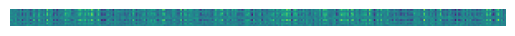

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


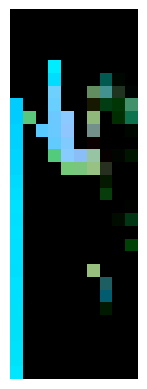

Epoch: 94 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 94 | Loss: 1.1511439085006714 


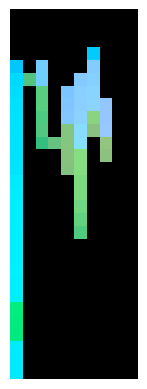

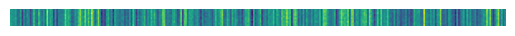

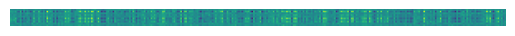

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


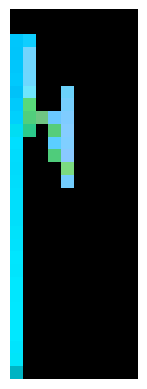

Epoch: 95 / 200


100%|█████████████████████████████████████████| 300/300 [02:21<00:00,  2.12it/s]

Epoch 95 | Loss: 1.3242133855819702 


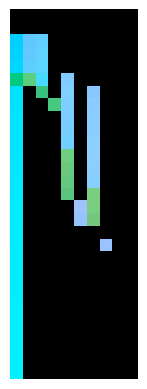

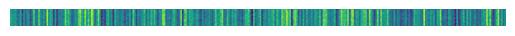

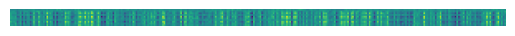

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


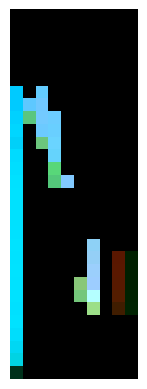

Epoch: 96 / 200


100%|█████████████████████████████████████████| 300/300 [02:20<00:00,  2.14it/s]

Epoch 96 | Loss: 1.6117156744003296 


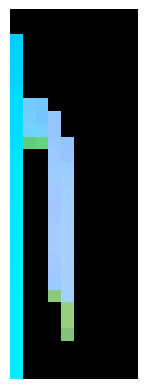

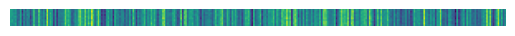

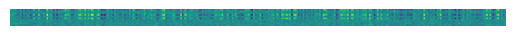

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


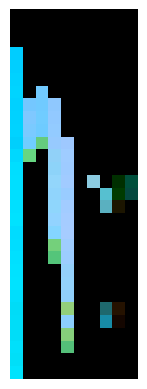

Epoch: 97 / 200


100%|█████████████████████████████████████████| 300/300 [02:20<00:00,  2.14it/s]

Epoch 97 | Loss: 1.5742703676223755 


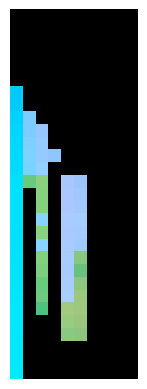

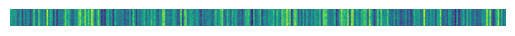

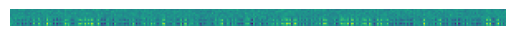

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


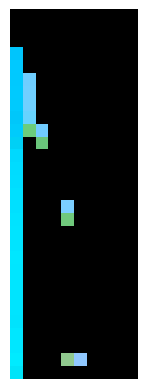

Epoch: 98 / 200


100%|█████████████████████████████████████████| 300/300 [02:18<00:00,  2.16it/s]

Epoch 98 | Loss: 1.9309625625610352 


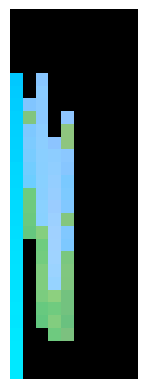

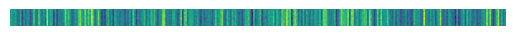

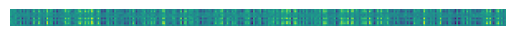

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


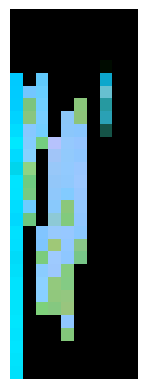

Epoch: 99 / 200


100%|█████████████████████████████████████████| 300/300 [02:19<00:00,  2.16it/s]

Epoch 99 | Loss: 1.3427093029022217 


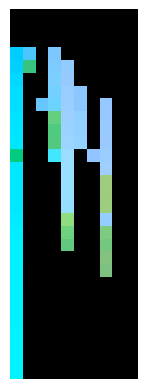

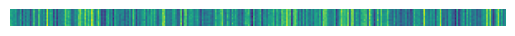

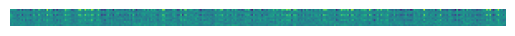

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


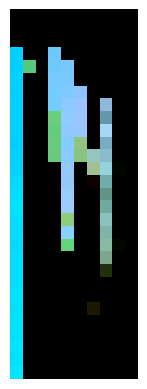

Epoch: 100 / 200


100%|█████████████████████████████████████████| 300/300 [02:18<00:00,  2.16it/s]

Epoch 100 | Loss: 1.452676773071289 


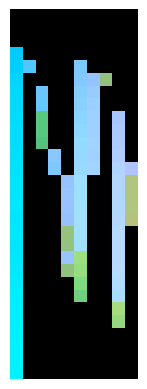

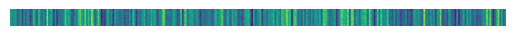

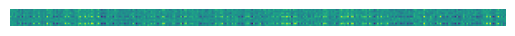

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


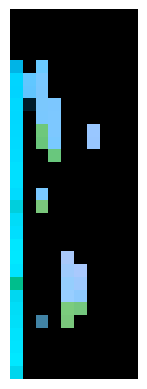

Epoch: 101 / 200


100%|█████████████████████████████████████████| 300/300 [02:18<00:00,  2.16it/s]

Epoch 101 | Loss: 1.0969889163970947 


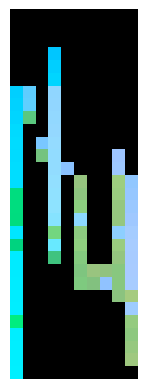

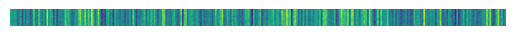

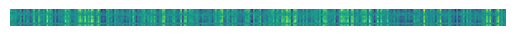

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


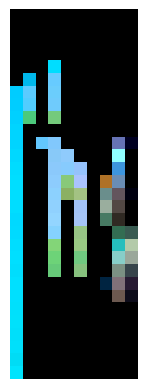

Epoch: 102 / 200


100%|█████████████████████████████████████████| 300/300 [02:18<00:00,  2.17it/s]

Epoch 102 | Loss: 1.5658000707626343 


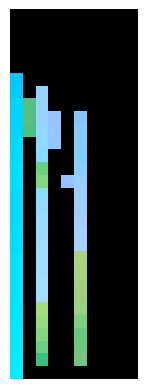

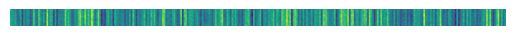

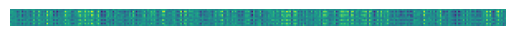

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


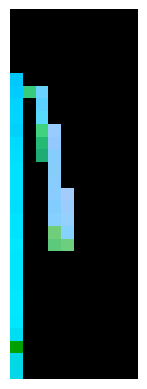

Epoch: 103 / 200


100%|█████████████████████████████████████████| 300/300 [02:18<00:00,  2.16it/s]

Epoch 103 | Loss: 1.6254706382751465 


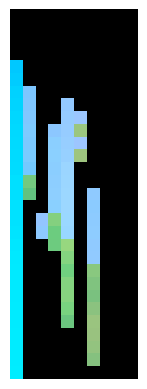

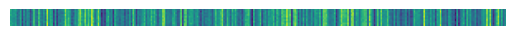

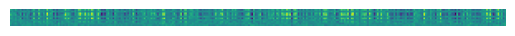

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


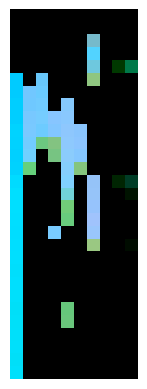

Epoch: 104 / 200


100%|█████████████████████████████████████████| 300/300 [02:17<00:00,  2.18it/s]

Epoch 104 | Loss: 1.4459296464920044 


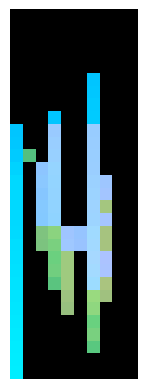

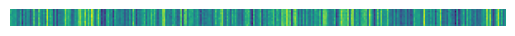

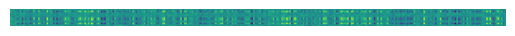

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


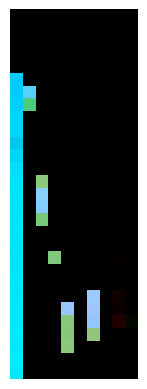

Epoch: 105 / 200


100%|█████████████████████████████████████████| 300/300 [02:17<00:00,  2.19it/s]

Epoch 105 | Loss: 1.6660023927688599 


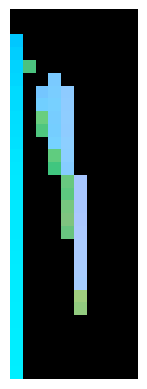

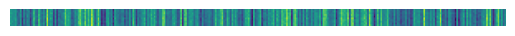

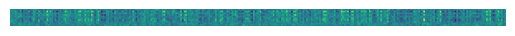

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


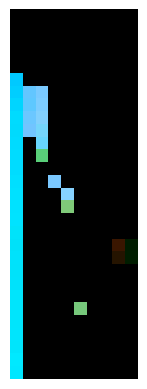

Epoch: 106 / 200


100%|█████████████████████████████████████████| 300/300 [02:17<00:00,  2.19it/s]

Epoch 106 | Loss: 1.6973663568496704 


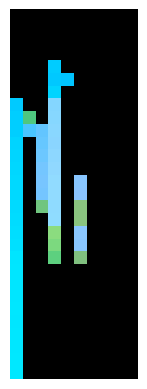

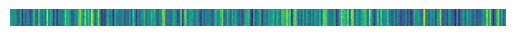

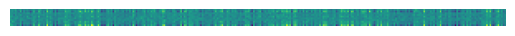

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


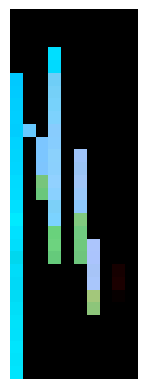

Epoch: 107 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 107 | Loss: 1.4311540126800537 


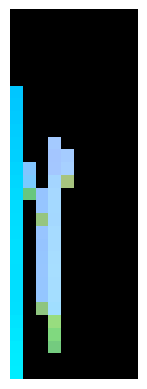

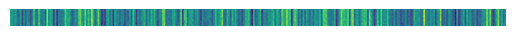

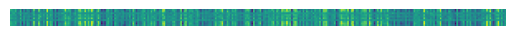

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


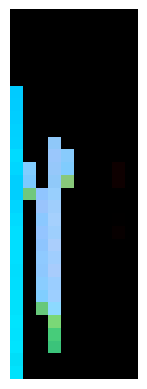

Epoch: 108 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 108 | Loss: 1.441813349723816 


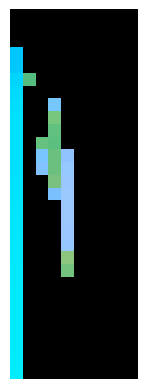

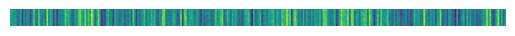

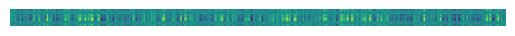

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


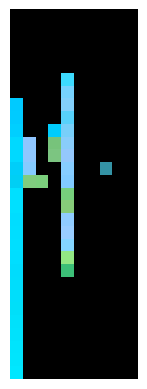

Epoch: 109 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 109 | Loss: 1.6586514711380005 


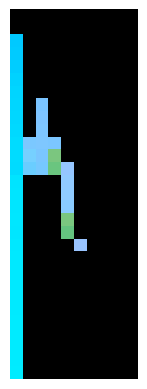

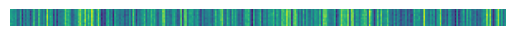

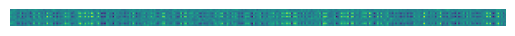

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


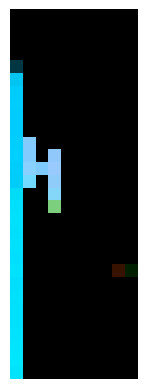

Epoch: 110 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.19it/s]

Epoch 110 | Loss: 1.708693504333496 


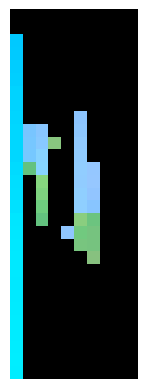

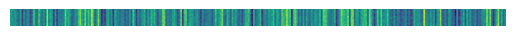

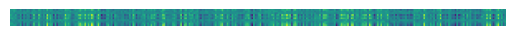

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


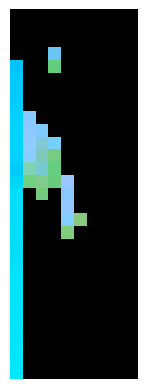

Epoch: 111 / 200


100%|█████████████████████████████████████████| 300/300 [02:17<00:00,  2.18it/s]

Epoch 111 | Loss: 1.4443562030792236 


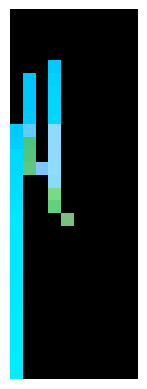

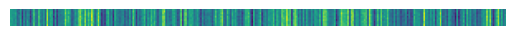

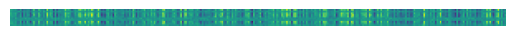

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


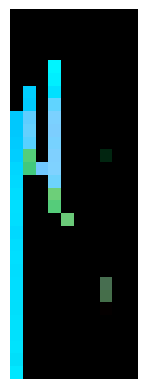

Epoch: 112 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.19it/s]

Epoch 112 | Loss: 1.1842269897460938 


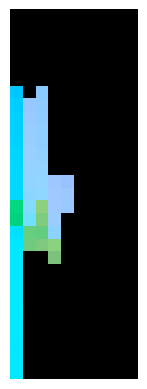

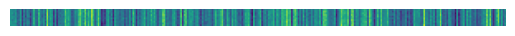

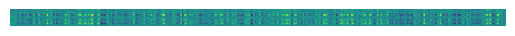

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


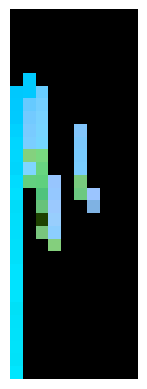

Epoch: 113 / 200


100%|█████████████████████████████████████████| 300/300 [02:17<00:00,  2.18it/s]

Epoch 113 | Loss: 1.5156515836715698 


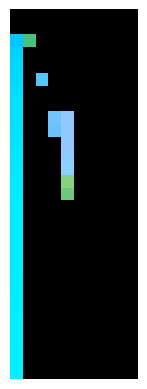

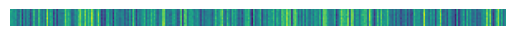

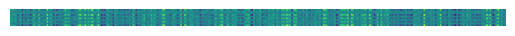

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


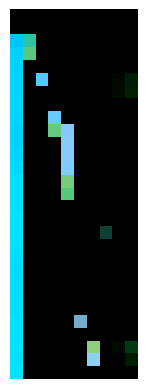

Epoch: 114 / 200


100%|█████████████████████████████████████████| 300/300 [02:17<00:00,  2.18it/s]

Epoch 114 | Loss: 1.4266997575759888 


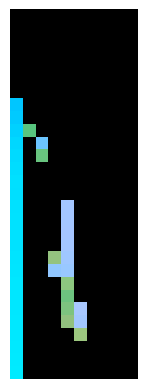

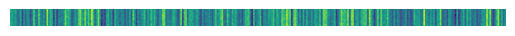

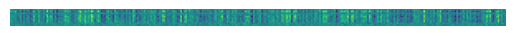

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


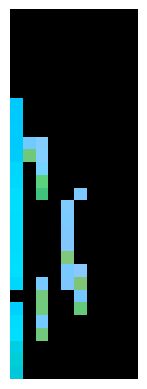

Epoch: 115 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.19it/s]

Epoch 115 | Loss: 1.5797476768493652 


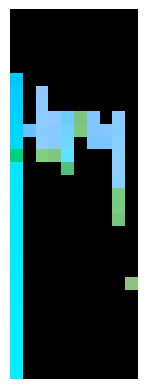

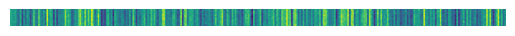

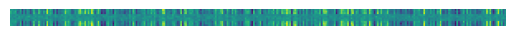

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


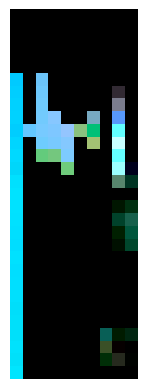

Epoch: 116 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 116 | Loss: 1.6958606243133545 


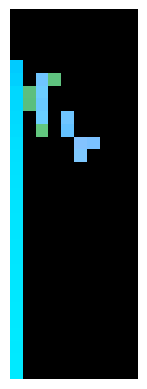

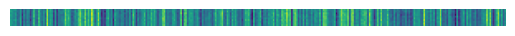

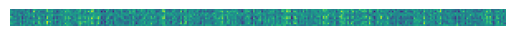

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


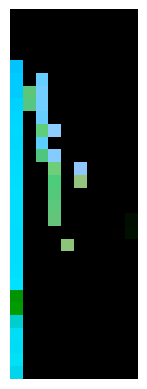

Epoch: 117 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 117 | Loss: 1.4582812786102295 


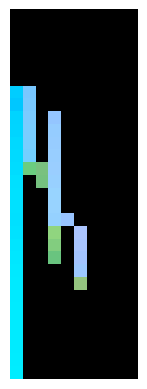

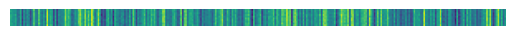

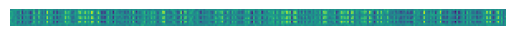

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


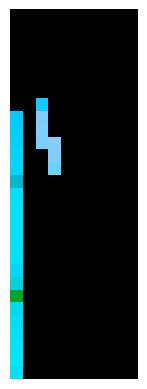

Epoch: 118 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 118 | Loss: 1.6469700336456299 


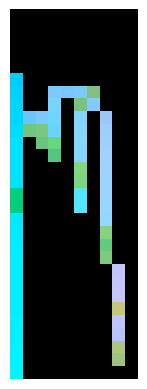

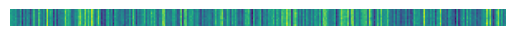

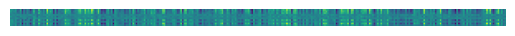

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


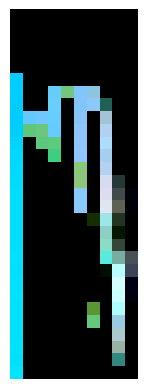

Epoch: 119 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 119 | Loss: 1.7009602785110474 


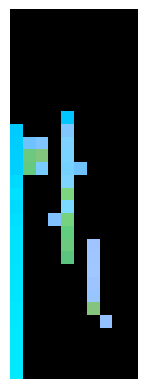

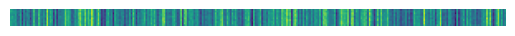

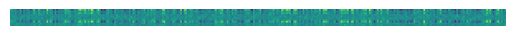

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


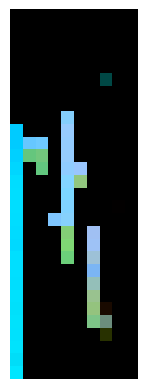

Epoch: 120 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 120 | Loss: 1.6220874786376953 


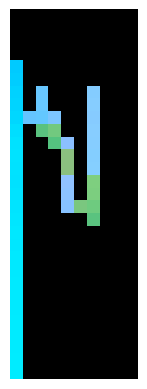

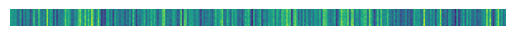

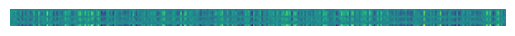

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


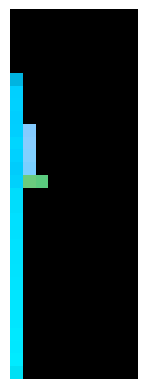

Epoch: 121 / 200


100%|█████████████████████████████████████████| 300/300 [02:15<00:00,  2.21it/s]

Epoch 121 | Loss: 1.585259199142456 


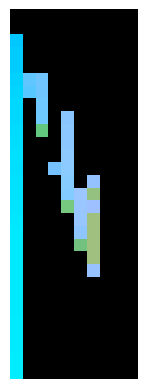

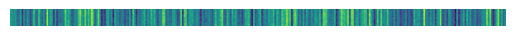

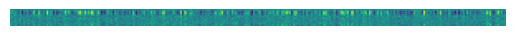

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


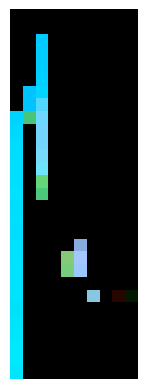

Epoch: 122 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.19it/s]

Epoch 122 | Loss: 1.4265272617340088 


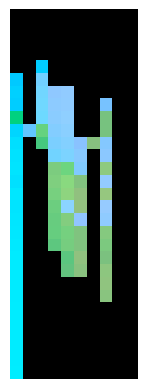

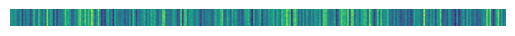

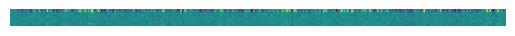

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


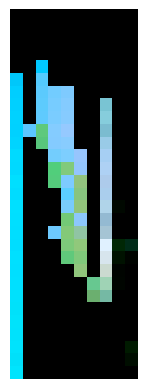

Epoch: 123 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 123 | Loss: 1.6132293939590454 


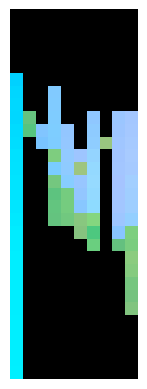

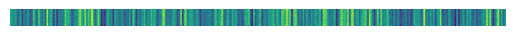

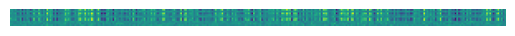

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


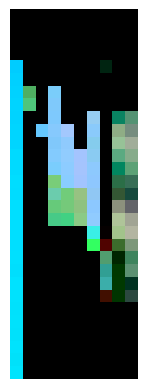

Epoch: 124 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.19it/s]

Epoch 124 | Loss: 1.7304519414901733 


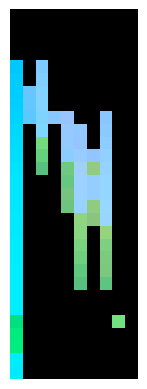

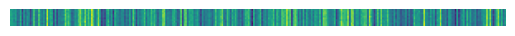

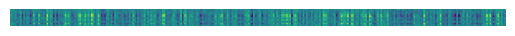

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


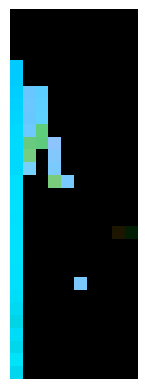

Epoch: 125 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 125 | Loss: 1.6499066352844238 


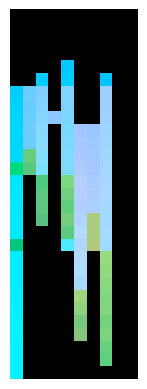

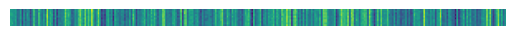

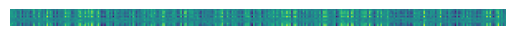

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


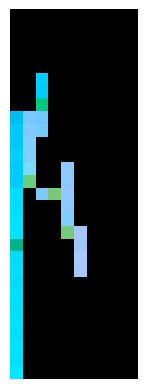

Epoch: 126 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.19it/s]

Epoch 126 | Loss: 1.6682442426681519 


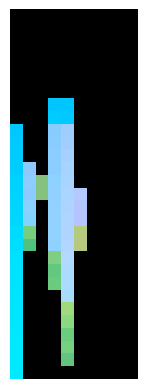

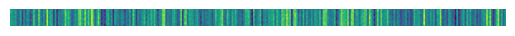

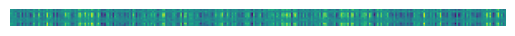

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


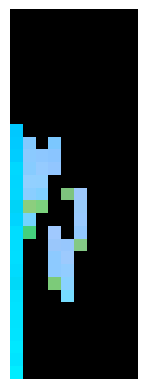

Epoch: 127 / 200


100%|█████████████████████████████████████████| 300/300 [02:17<00:00,  2.19it/s]

Epoch 127 | Loss: 1.2041884660720825 


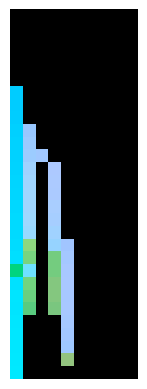

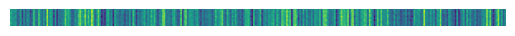

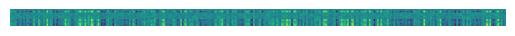

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


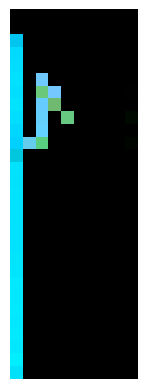

Epoch: 128 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.19it/s]

Epoch 128 | Loss: 1.688085913658142 


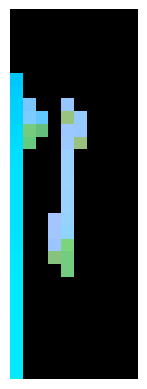

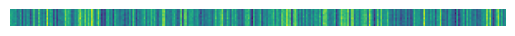

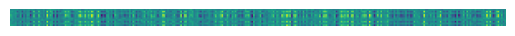

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


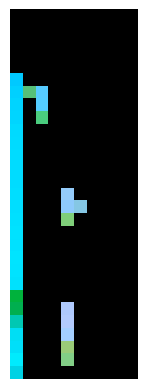

Epoch: 129 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.19it/s]

Epoch 129 | Loss: 1.501736044883728 


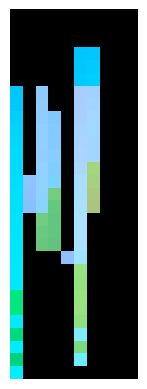

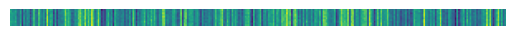

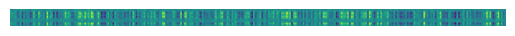

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


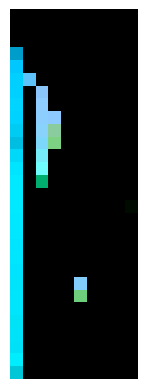

Epoch: 130 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 130 | Loss: 1.438963532447815 


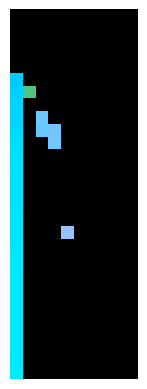

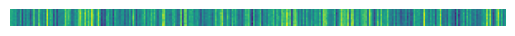

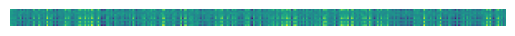

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


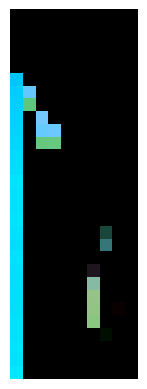

Epoch: 131 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 131 | Loss: 1.4528539180755615 


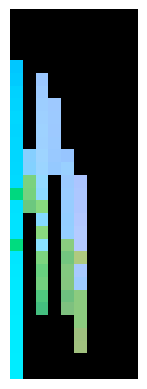

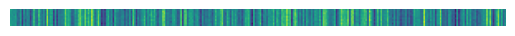

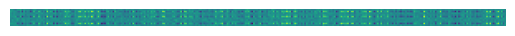

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


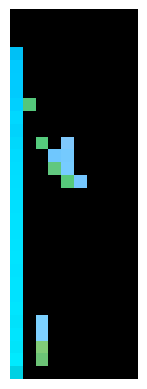

Epoch: 132 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 132 | Loss: 1.5369433164596558 


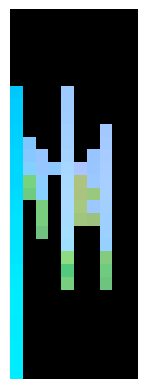

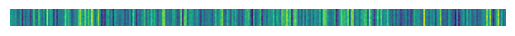

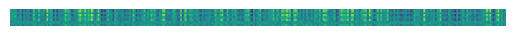

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


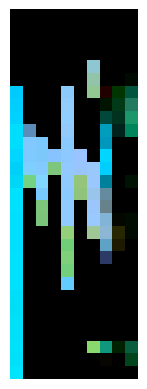

Epoch: 133 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 133 | Loss: 1.369128942489624 


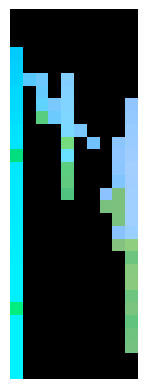

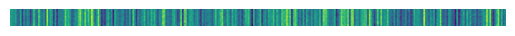

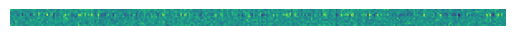

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


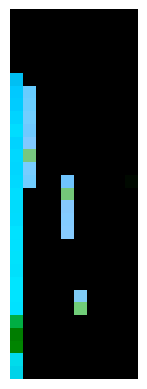

Epoch: 134 / 200


100%|█████████████████████████████████████████| 300/300 [02:15<00:00,  2.21it/s]

Epoch 134 | Loss: 1.2697699069976807 


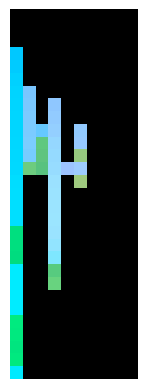

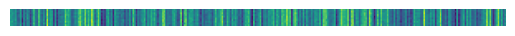

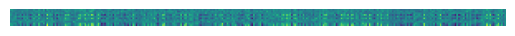

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


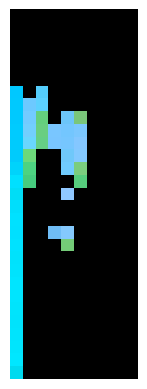

Epoch: 135 / 200


100%|█████████████████████████████████████████| 300/300 [02:15<00:00,  2.21it/s]

Epoch 135 | Loss: 1.5146206617355347 


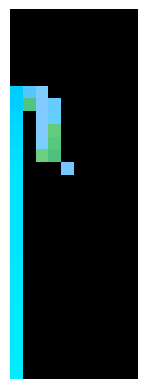

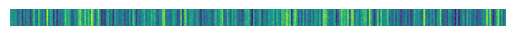

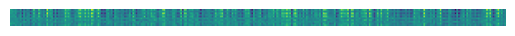

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


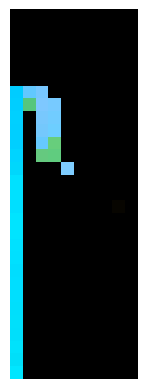

Epoch: 136 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 136 | Loss: 1.5277312994003296 


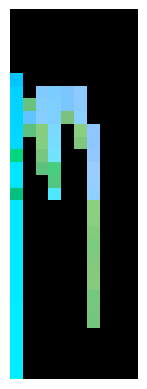

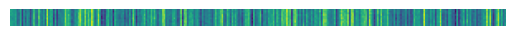

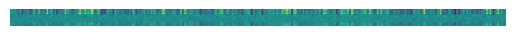

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


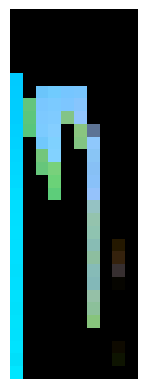

Epoch: 137 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.19it/s]

Epoch 137 | Loss: 1.492438793182373 


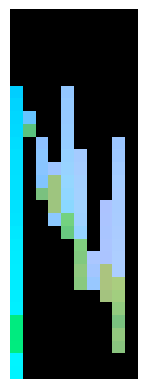

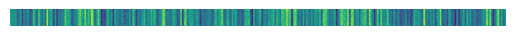

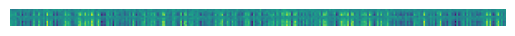

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


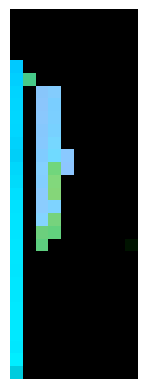

Epoch: 138 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.21it/s]

Epoch 138 | Loss: 1.7060303688049316 


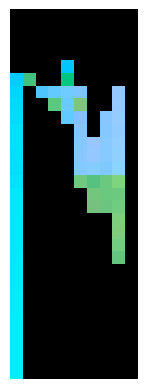

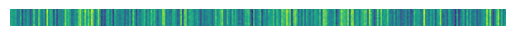

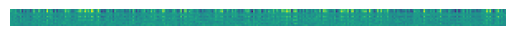

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


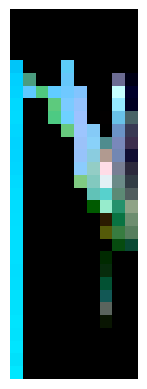

Epoch: 139 / 200


100%|█████████████████████████████████████████| 300/300 [02:14<00:00,  2.22it/s]

Epoch 139 | Loss: 1.4475278854370117 


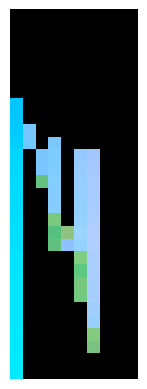

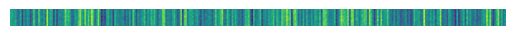

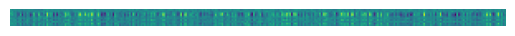

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


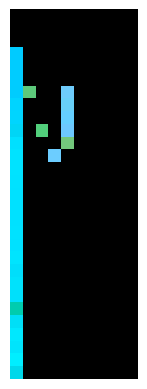

Epoch: 140 / 200


100%|█████████████████████████████████████████| 300/300 [02:16<00:00,  2.20it/s]

Epoch 140 | Loss: 1.4943993091583252 


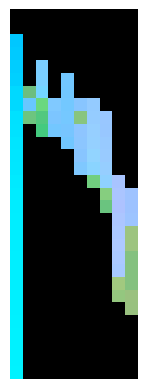

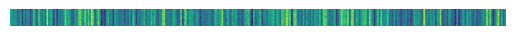

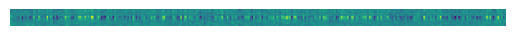

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


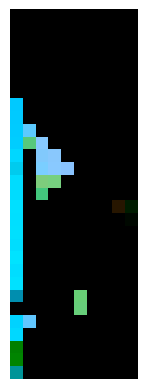

Epoch: 141 / 200


100%|█████████████████████████████████████████| 300/300 [02:15<00:00,  2.21it/s]

Epoch 141 | Loss: 1.4061366319656372 


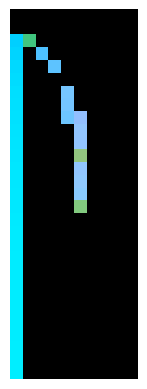

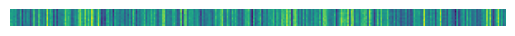

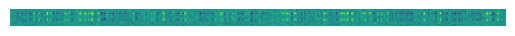

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


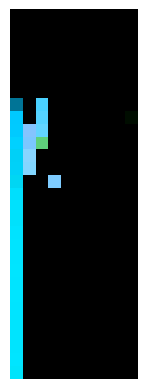

Epoch: 142 / 200


100%|█████████████████████████████████████████| 300/300 [02:14<00:00,  2.23it/s]

Epoch 142 | Loss: 1.853336215019226 


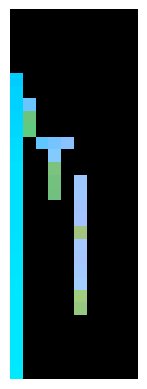

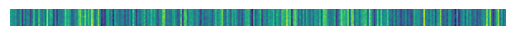

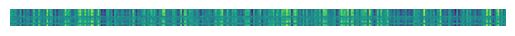

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


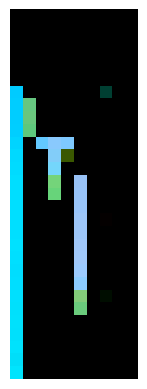

Epoch: 143 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.24it/s]

Epoch 143 | Loss: 1.5546514987945557 


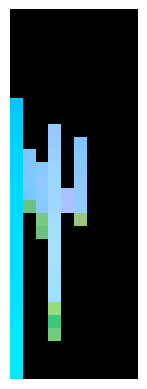

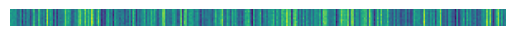

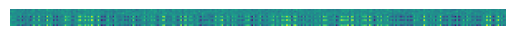

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


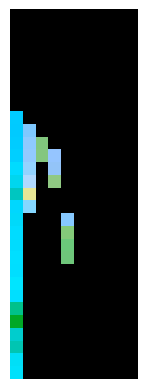

Epoch: 144 / 200


100%|█████████████████████████████████████████| 300/300 [02:17<00:00,  2.18it/s]

Epoch 144 | Loss: 1.5465545654296875 


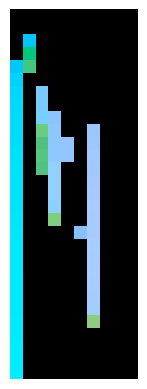

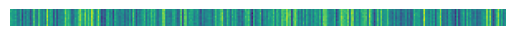

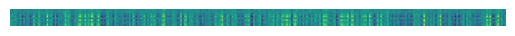

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


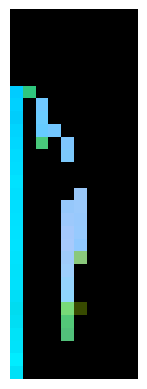

Epoch: 145 / 200


100%|█████████████████████████████████████████| 300/300 [02:22<00:00,  2.11it/s]

Epoch 145 | Loss: 1.2486882209777832 


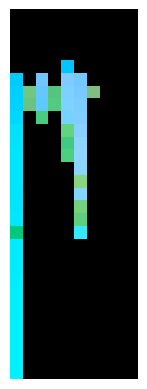

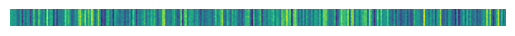

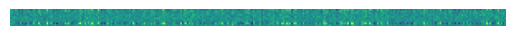

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


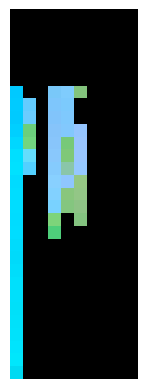

Epoch: 146 / 200


100%|█████████████████████████████████████████| 300/300 [04:34<00:00,  1.09it/s]

Epoch 146 | Loss: 1.3589444160461426 


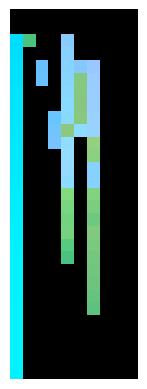

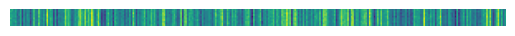

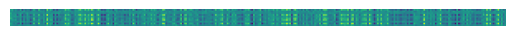

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


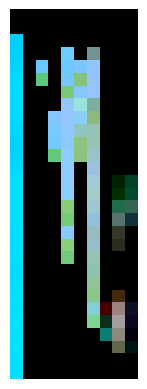

Epoch: 147 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 147 | Loss: 1.78640878200531 


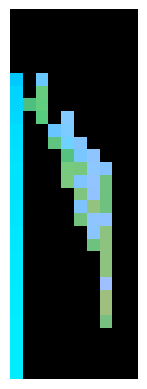

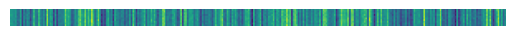

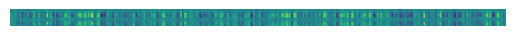

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


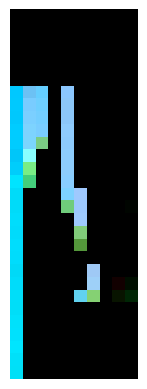

Epoch: 148 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 148 | Loss: 1.657281756401062 


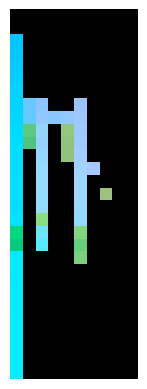

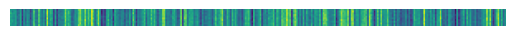

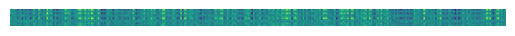

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


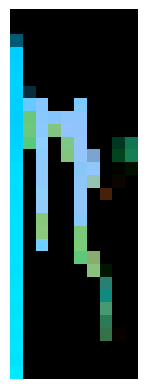

Epoch: 149 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 149 | Loss: 1.4499739408493042 


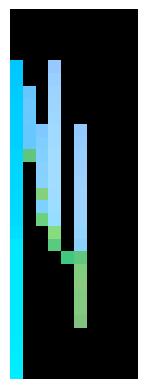

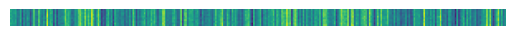

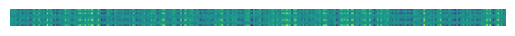

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


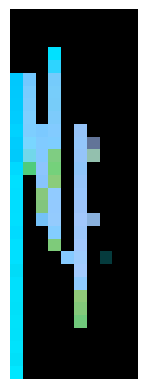

Epoch: 150 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 150 | Loss: 1.704545259475708 


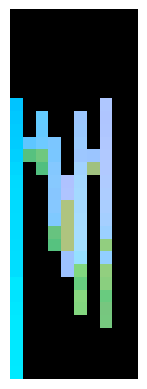

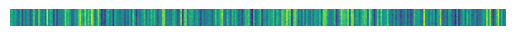

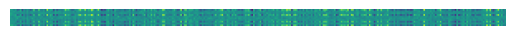

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


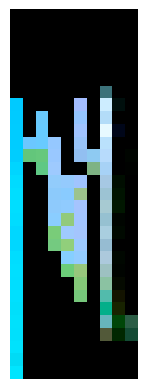

Epoch: 151 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 151 | Loss: 1.4476574659347534 


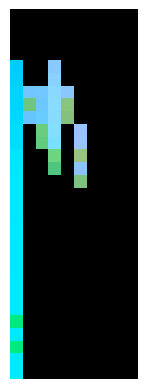

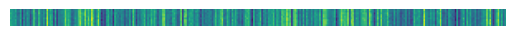

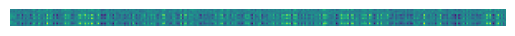

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


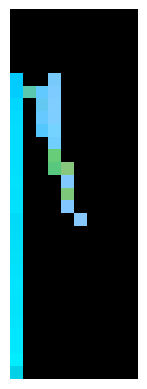

Epoch: 152 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 152 | Loss: 1.7845655679702759 


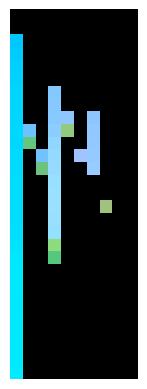

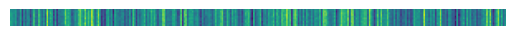

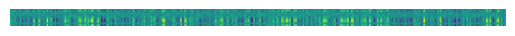

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


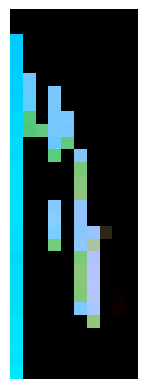

Epoch: 153 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 153 | Loss: 1.5470525026321411 


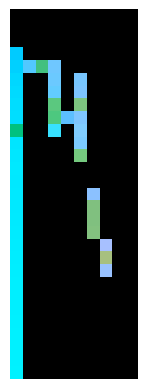

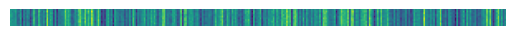

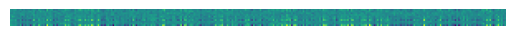

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


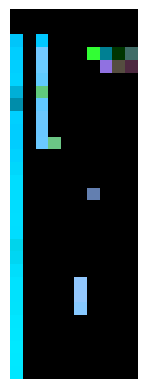

Epoch: 154 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 154 | Loss: 1.5204411745071411 


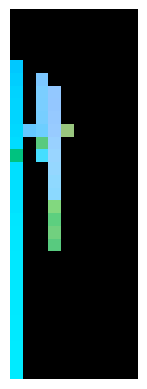

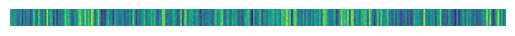

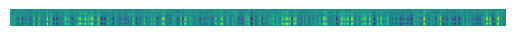

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


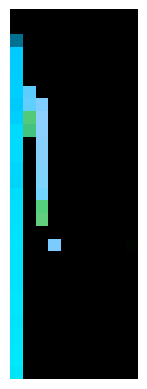

Epoch: 155 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 155 | Loss: 1.4764511585235596 


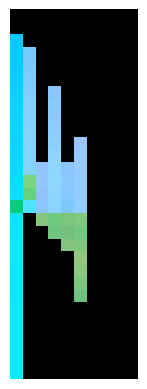

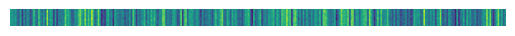

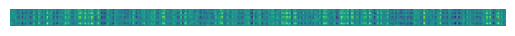

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


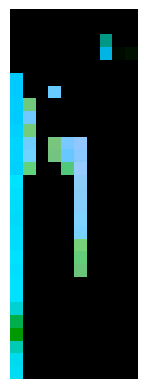

Epoch: 156 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 156 | Loss: 1.7009598016738892 


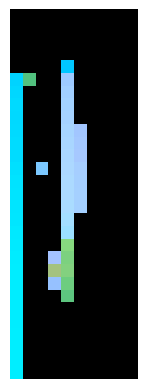

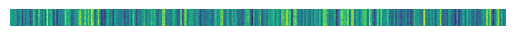

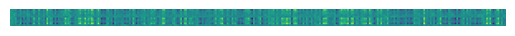

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


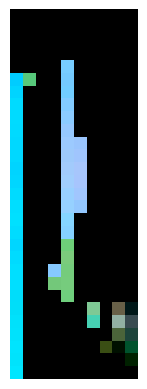

Epoch: 157 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 157 | Loss: 1.4495002031326294 


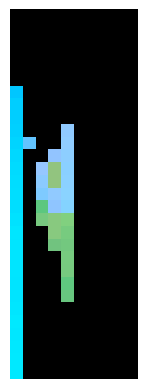

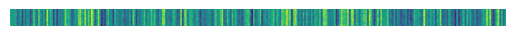

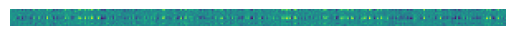

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


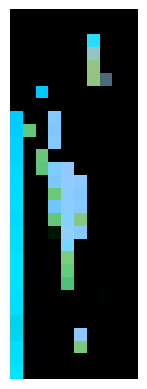

Epoch: 158 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 158 | Loss: 1.4360946416854858 


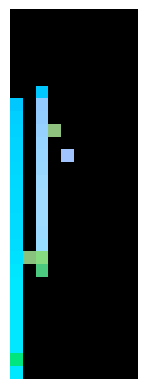

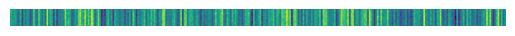

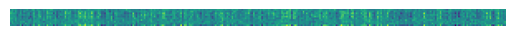

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


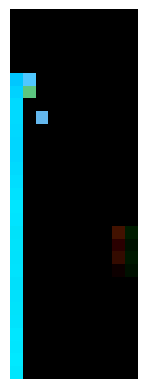

Epoch: 159 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 159 | Loss: 1.5033243894577026 


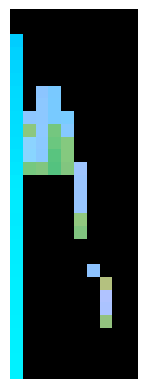

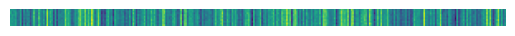

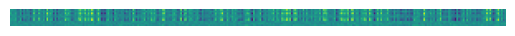

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


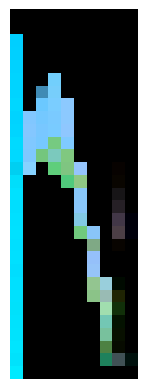

Epoch: 160 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 160 | Loss: 1.5713869333267212 


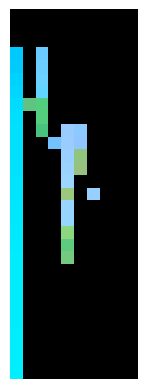

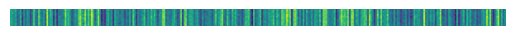

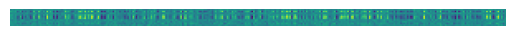

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


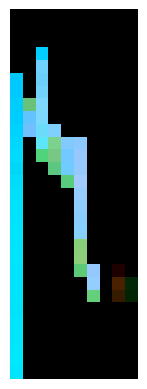

Epoch: 161 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 161 | Loss: 1.608271837234497 


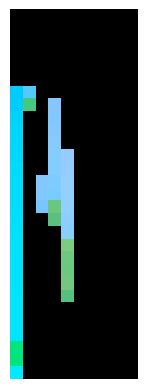

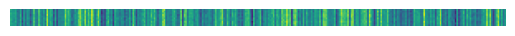

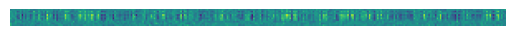

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


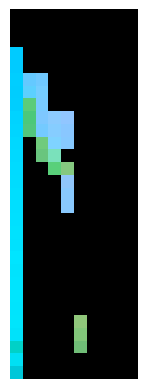

Epoch: 162 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 162 | Loss: 1.763515830039978 


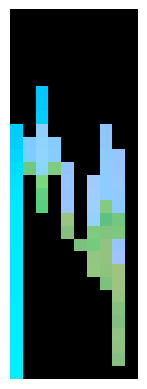

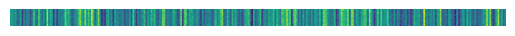

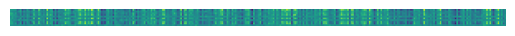

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


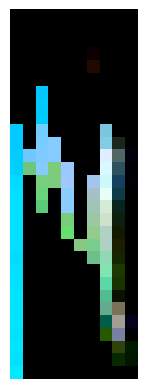

Epoch: 163 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 163 | Loss: 1.3852782249450684 


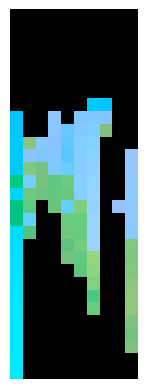

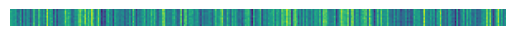

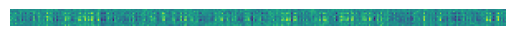

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


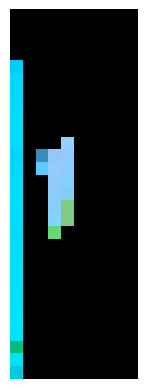

Epoch: 164 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 164 | Loss: 1.5256574153900146 


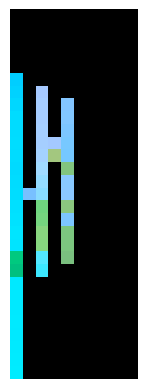

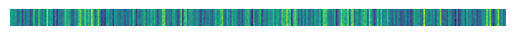

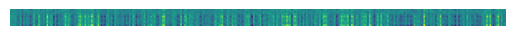

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


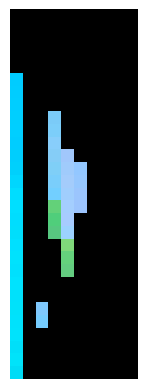

Epoch: 165 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 165 | Loss: 1.3226654529571533 


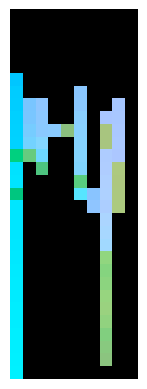

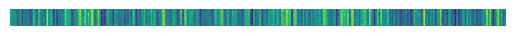

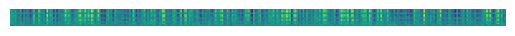

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


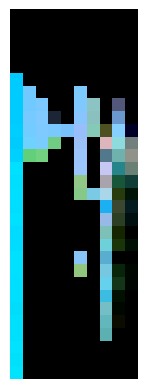

Epoch: 166 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 166 | Loss: 1.4023805856704712 


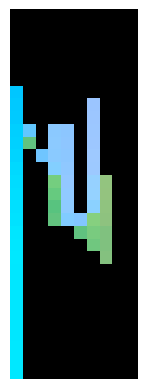

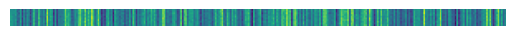

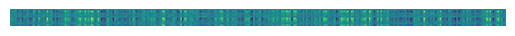

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


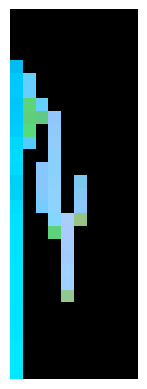

Epoch: 167 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 167 | Loss: 1.5325655937194824 


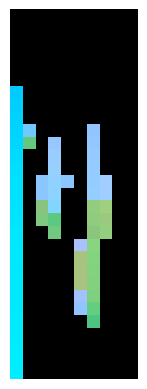

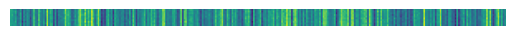

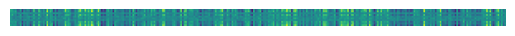

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


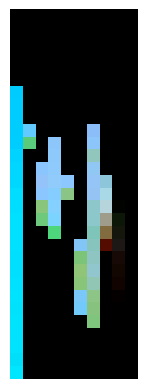

Epoch: 168 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 168 | Loss: 1.608791470527649 


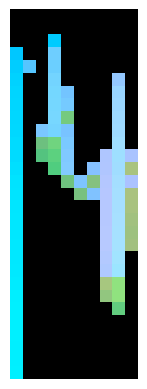

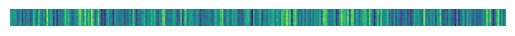

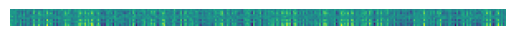

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


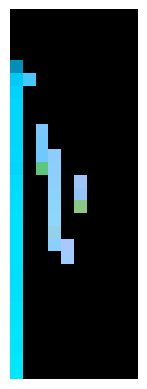

Epoch: 169 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 169 | Loss: 1.691672444343567 


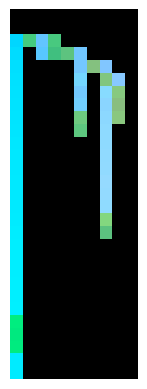

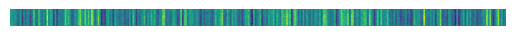

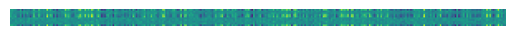

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


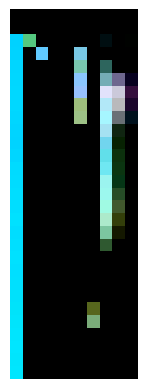

Epoch: 170 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 170 | Loss: 1.9256943464279175 


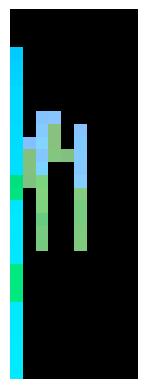

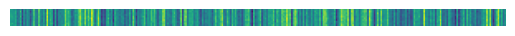

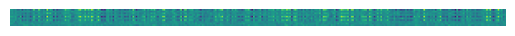

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


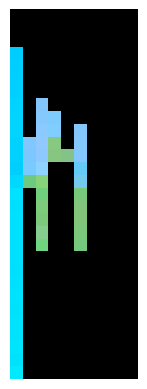

Epoch: 171 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 171 | Loss: 1.554616928100586 


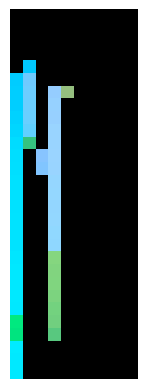

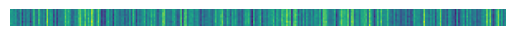

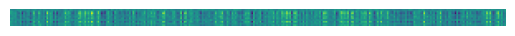

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


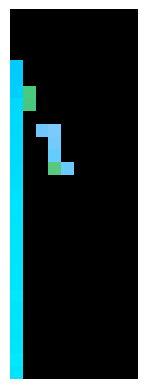

Epoch: 172 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 172 | Loss: 1.5572444200515747 


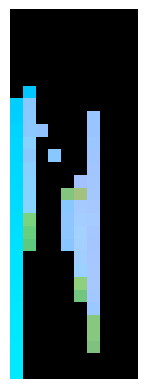

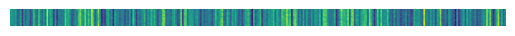

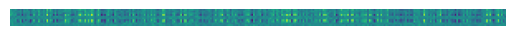

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


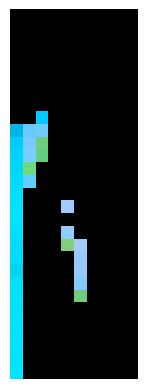

Epoch: 173 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 173 | Loss: 1.5307283401489258 


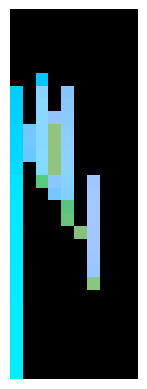

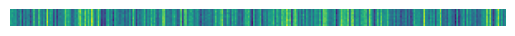

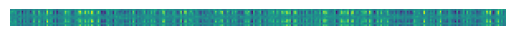

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


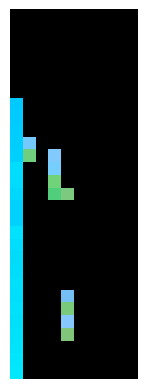

Epoch: 174 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 174 | Loss: 1.6627627611160278 


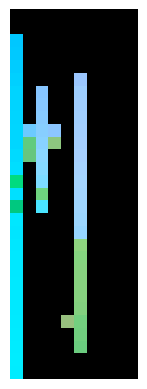

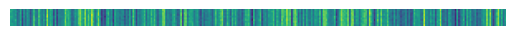

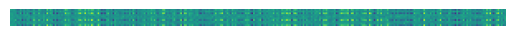

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


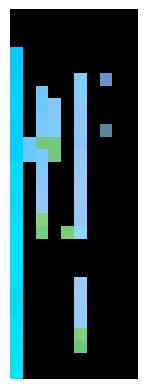

Epoch: 175 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 175 | Loss: 1.6280148029327393 


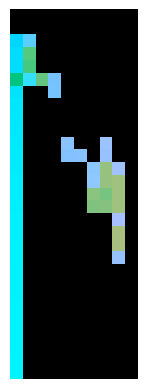

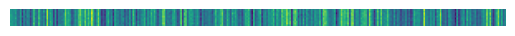

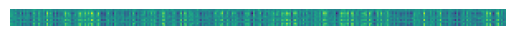

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


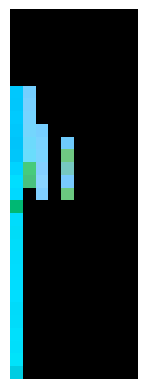

Epoch: 176 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 176 | Loss: 1.5415160655975342 


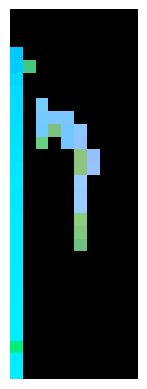

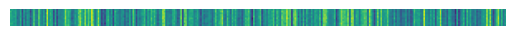

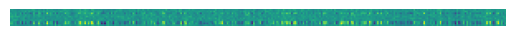

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


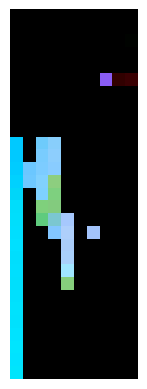

Epoch: 177 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.27it/s]

Epoch 177 | Loss: 1.6163657903671265 


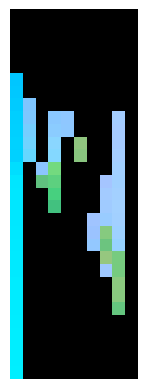

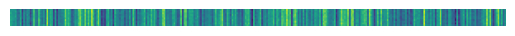

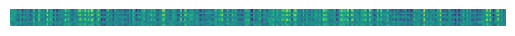

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


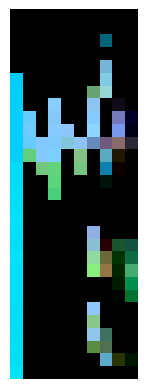

Epoch: 178 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 178 | Loss: 1.7562975883483887 


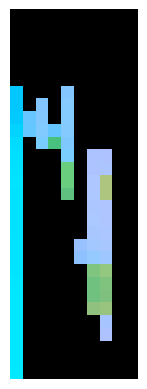

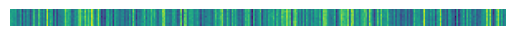

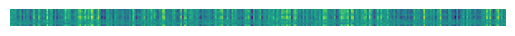

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


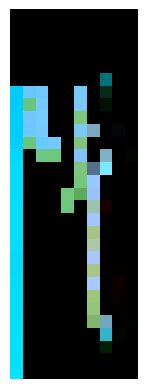

Epoch: 179 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 179 | Loss: 1.5006345510482788 


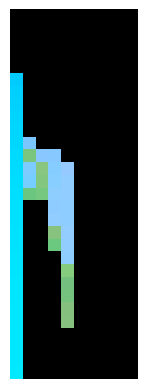

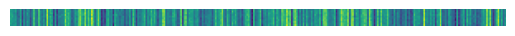

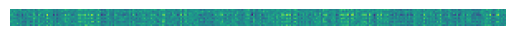

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


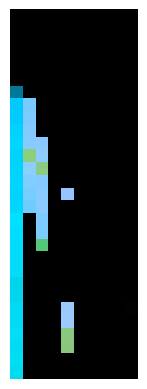

Epoch: 180 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 180 | Loss: 1.7148305177688599 


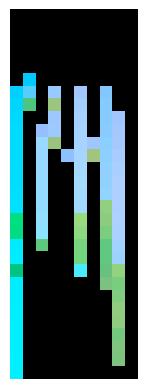

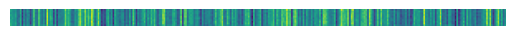

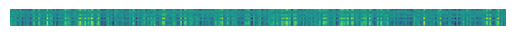

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


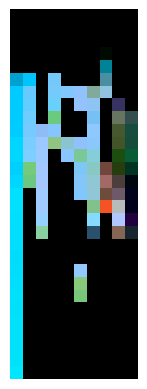

Epoch: 181 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 181 | Loss: 1.7104673385620117 


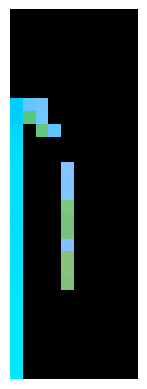

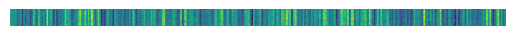

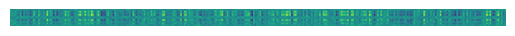

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


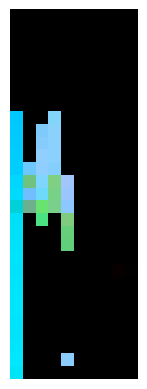

Epoch: 182 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 182 | Loss: 1.584633708000183 


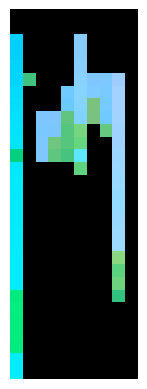

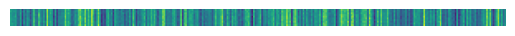

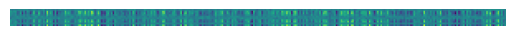

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


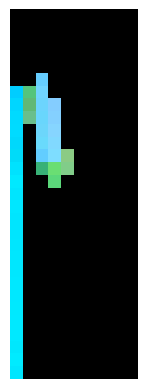

Epoch: 183 / 200


100%|███████████████████████████████████████| 300/300 [1:45:45<00:00, 21.15s/it]

Epoch 183 | Loss: 1.3572295904159546 


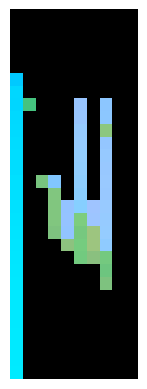

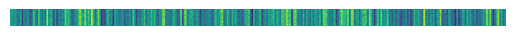

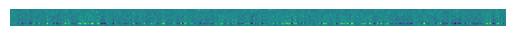

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


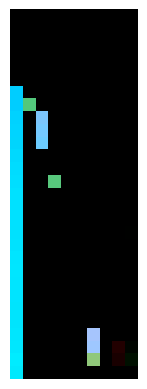

Epoch: 184 / 200


100%|█████████████████████████████████████████| 300/300 [02:35<00:00,  1.93it/s]

Epoch 184 | Loss: 1.631229043006897 


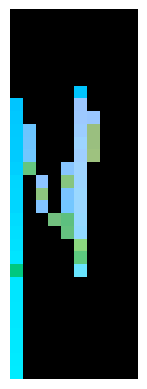

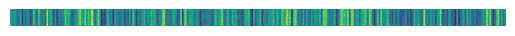

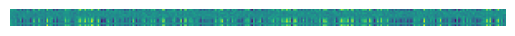

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


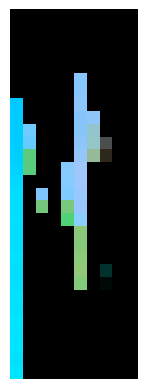

Epoch: 185 / 200


100%|███████████████████████████████████████| 300/300 [3:20:31<00:00, 40.11s/it]

Epoch 185 | Loss: 1.4103156328201294 


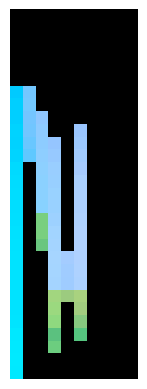

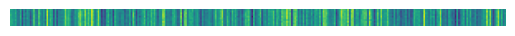

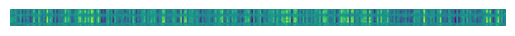

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


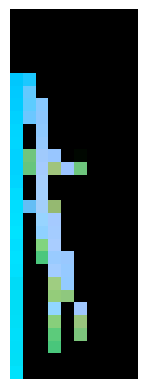

Epoch: 186 / 200


100%|███████████████████████████████████████| 300/300 [1:48:04<00:00, 21.62s/it]

Epoch 186 | Loss: 1.5626415014266968 


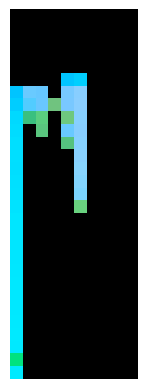

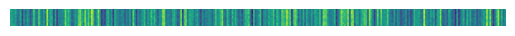

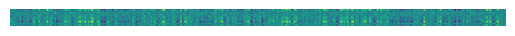

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


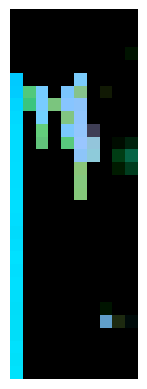

Epoch: 187 / 200


100%|█████████████████████████████████████████| 300/300 [02:15<00:00,  2.22it/s]

Epoch 187 | Loss: 1.4158897399902344 


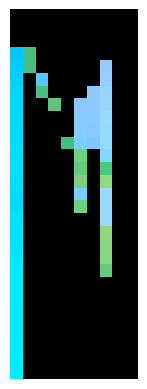

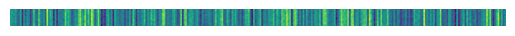

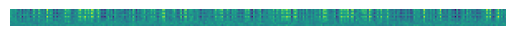

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


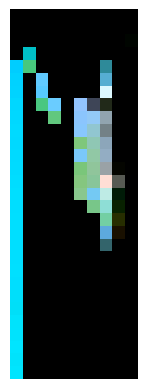

Epoch: 188 / 200


100%|█████████████████████████████████████████| 300/300 [02:14<00:00,  2.23it/s]

Epoch 188 | Loss: 1.4922698736190796 


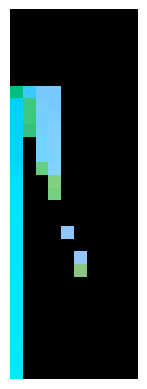

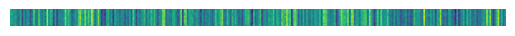

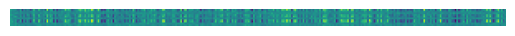

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


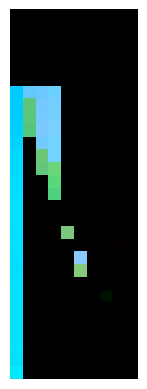

Epoch: 189 / 200


100%|█████████████████████████████████████████| 300/300 [02:18<00:00,  2.17it/s]

Epoch 189 | Loss: 1.5339505672454834 


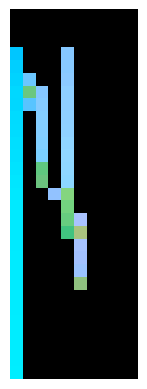

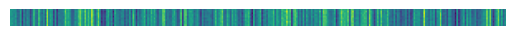

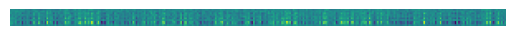

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


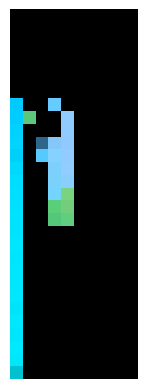

Epoch: 190 / 200


100%|█████████████████████████████████████████| 300/300 [02:15<00:00,  2.21it/s]

Epoch 190 | Loss: 1.5910636186599731 


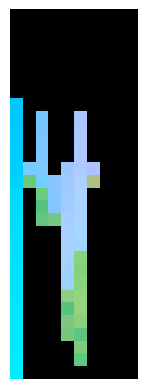

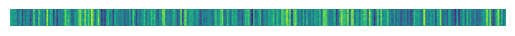

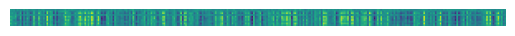

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


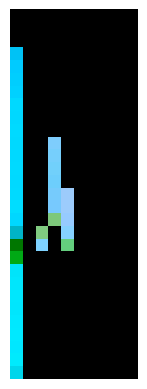

Epoch: 191 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.25it/s]

Epoch 191 | Loss: 1.7220559120178223 


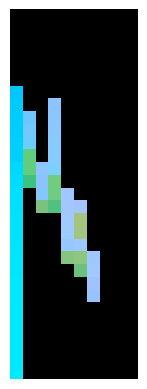

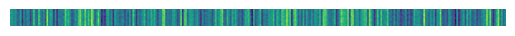

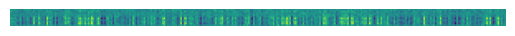

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


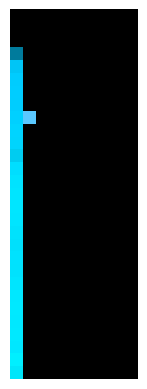

Epoch: 192 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 192 | Loss: 1.5696392059326172 


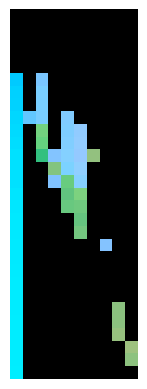

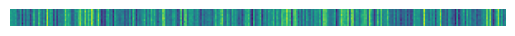

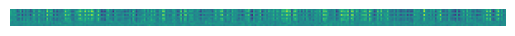

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


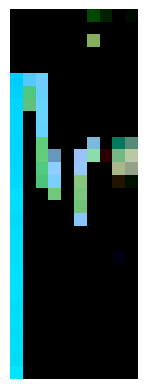

Epoch: 193 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 193 | Loss: 1.328014612197876 


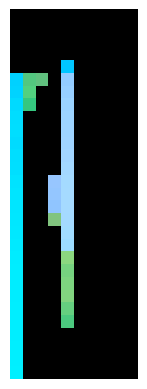

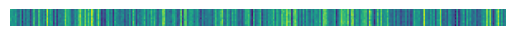

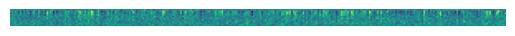

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


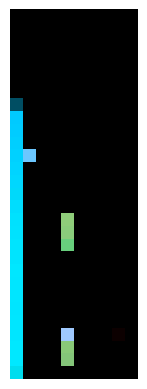

Epoch: 194 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.25it/s]

Epoch 194 | Loss: 1.9225972890853882 


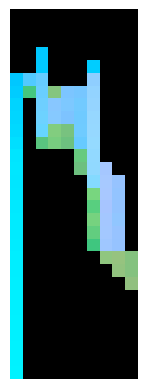

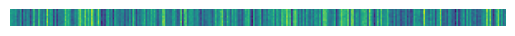

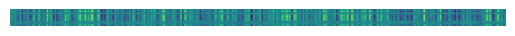

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


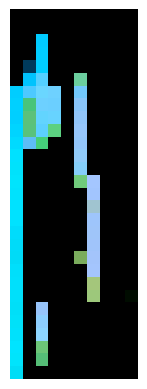

Epoch: 195 / 200


100%|█████████████████████████████████████████| 300/300 [02:14<00:00,  2.23it/s]

Epoch 195 | Loss: 1.482308268547058 


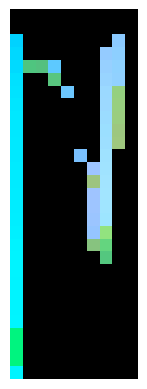

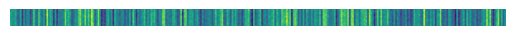

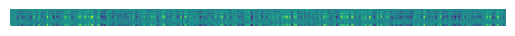

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


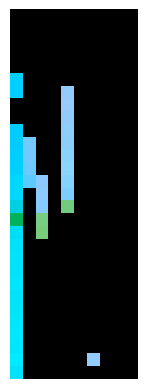

Epoch: 196 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.25it/s]

Epoch 196 | Loss: 1.4384522438049316 


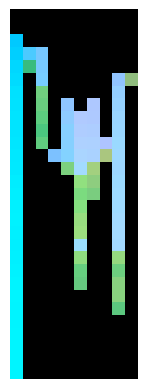

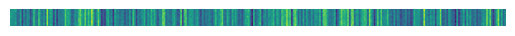

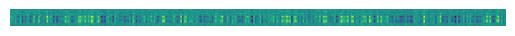

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


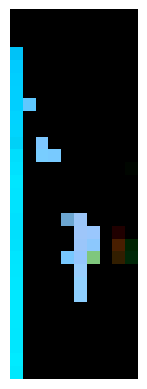

Epoch: 197 / 200


100%|█████████████████████████████████████████| 300/300 [02:13<00:00,  2.25it/s]

Epoch 197 | Loss: 1.5498065948486328 


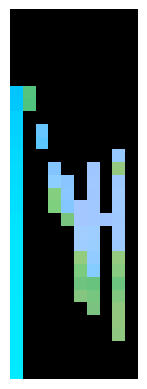

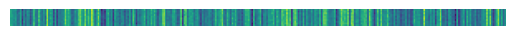

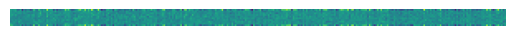

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


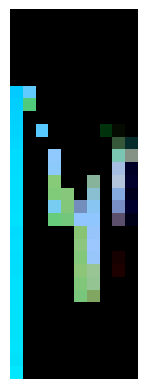

Epoch: 198 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 198 | Loss: 1.6727107763290405 


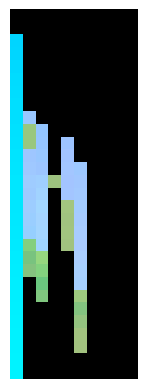

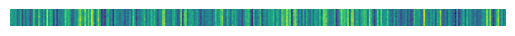

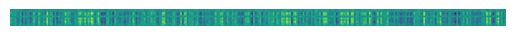

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


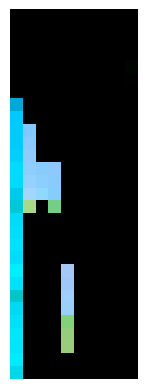

Epoch: 199 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 199 | Loss: 1.5341719388961792 


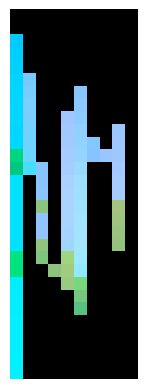

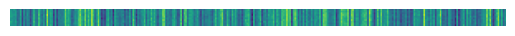

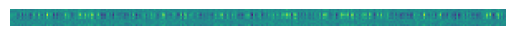

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


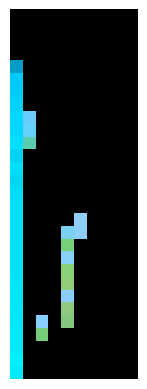

Epoch: 200 / 200


100%|█████████████████████████████████████████| 300/300 [02:12<00:00,  2.26it/s]

Epoch 200 | Loss: 1.441760540008545 


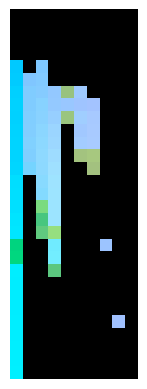

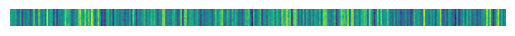

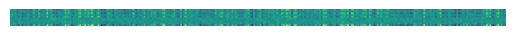

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


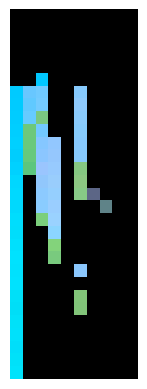

In [87]:



data_path = "data/dataset_distlognorm_massnorm.pt"
data = torch.load(data_path)
bs = 128
sample = data[:bs]
dataloader_diff = DataLoader(sample, batch_size = bs, shuffle = True)
dataloader_diff = DataLoader(dataset, batch_size = bs, shuffle = True)

# hyperparameters
T = 1000
epochs = 200
lr = 3e-4

# load models
latent_diffusion_model = LatentDiffusionModel()

noise = torch.randn(bs, latent_dim).to(device)

encoder_test, decodertest, latent_diffusion_modeltest = training_latent_diffusion_latent(encoder,
                                                                                          generator,
                                                                                          latent_diffusion_model,
                                                                                          dataloader_diff,
                                                                                          epochs,
                                                                                          lr,
                                                                                          T,
                                                                                          device,
                                                                                          pretrained = True)

# generate

In [96]:
@torch.no_grad()
def sample_timestep(model, x, t, betas, sqrt_one_minus_alphas_cumprod, sqrt_recip_alphas, posterior_variance):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t)
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

@torch.no_grad()
def sample_plot_image(model, decoder, T, betas, sqrt_one_minus_alphas_cumprod, sqrt_recip_alphas, posterior_variance):
    # Sample noise
    img_size = 64
    img = torch.randn((1, 300), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(model, img, t, betas, sqrt_one_minus_alphas_cumprod, sqrt_recip_alphas, posterior_variance)
        generated = decoder(img)
        # Edit: This is to maintain the natural range of the distribution
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(generated.detach().cpu())
    plt.show()

/var/folders/th/xzh64xy15874rx6gs9kn93qw0000gn/T/ipykernel_78829/4108158959.py:41: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize)+1)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid rang

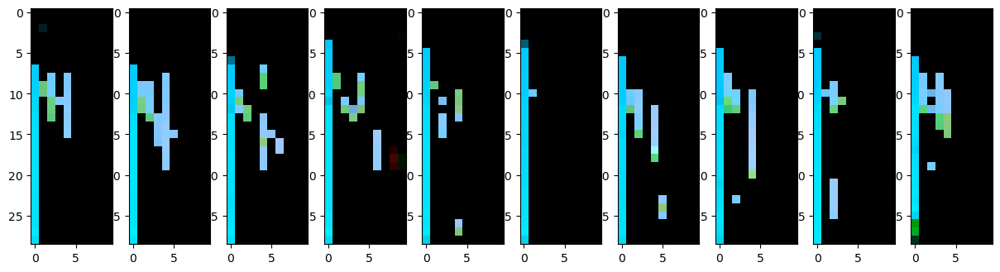

In [99]:
T = 1000
betas = linear_beta_schedule(timesteps=T)
# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)
    
sample_plot_image(latent_diffusion_modeltest,decodertest, T, betas, sqrt_one_minus_alphas_cumprod, sqrt_recip_alphas, posterior_variance)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


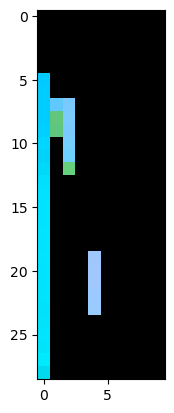

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


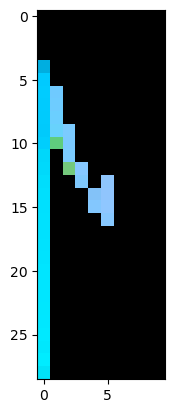

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


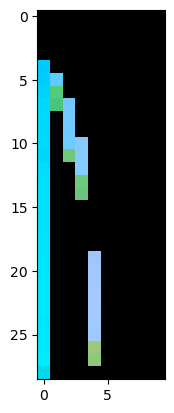

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


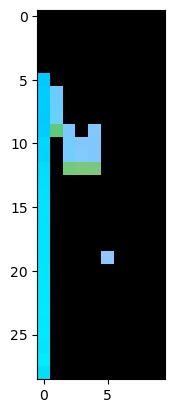

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


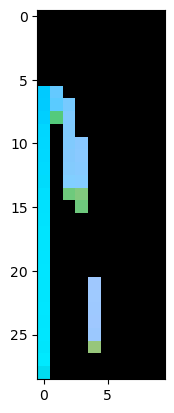

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


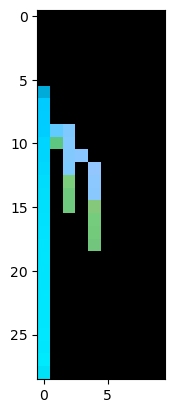

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


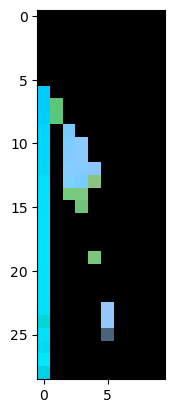

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


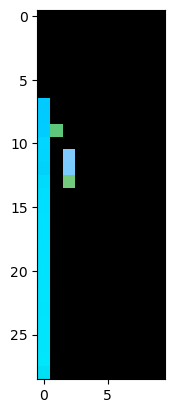

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


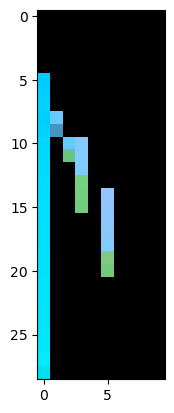

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


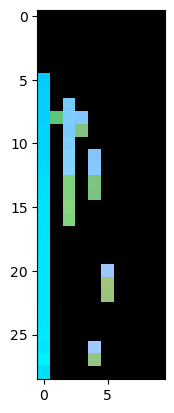

In [151]:
transform = transforms.Resize((64, 64))
transform_back = transforms.Resize((10, 10))
T = 1000


high = 1.0
low = -1.0
noise = torch.rand(1, 300) * (high - (low)) + (low)



for i in range(10):
    noise = torch.randn((1, 300), device=device)
    out_test = generated_image(latent_diffusion_modeltest, noise, T)
    output = generator(out_test)
    plt.imshow(output[0].permute(1, 2, 0).detach())
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


image 26720:


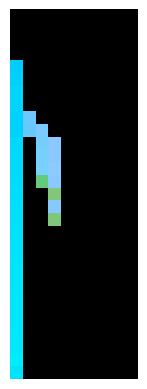

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


image 6544:


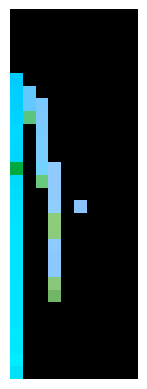

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


image 17615:


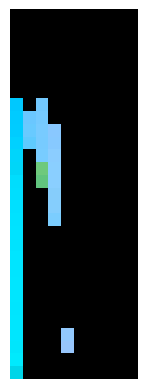

Consistency:


Percentage of consistant images = 62.88% vs. 97.51% in training data

Inconsistency reasons:
inconsistency due to zero / nonzero mistake = 18.75%
inconsistency due to distance not zero in main branch =  0.00%
inconsistency due to gap between branches =  76.83%
inconsistency due to zgap in branch 27.58%
inconsistency due to last descendant dont exist 0.00%

Number of images with two or more inconsistencies = 2981, which is  20.94%
That corresponds to 7.77% of all images


Of all images, 6.96% have zero inconsistency
Of all images, 0.00% have distance main branch inconsistency
Of all images, 28.52% have gap between branches inconsistency
Of all images, 10.24% have gap within branch inconsistency
Of all images, 0.00% have last descendant inconsistency



MASS:
monotonicity threshold = -1e-06% change
number of occurences where mass is not preserved = 394538
perc of occurences where mass is not preserved = 26.44% vs. 25.77% in training data




monotonicity threshold = -0.01%

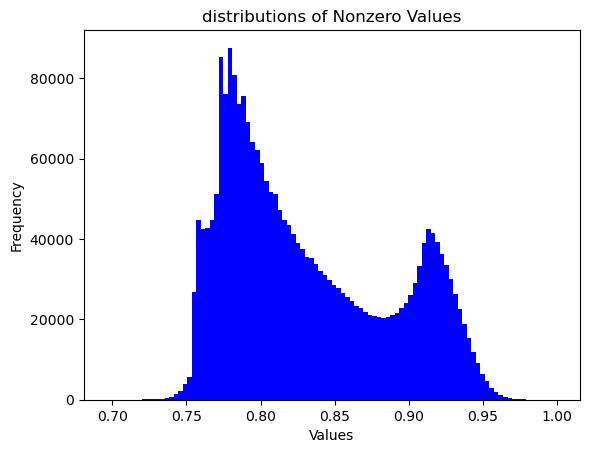

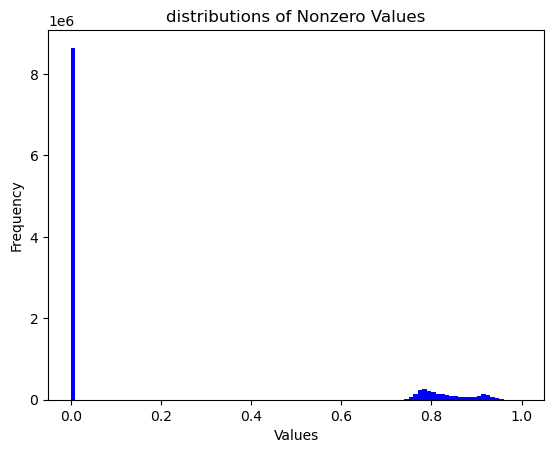

number of nonzero values = 2475374
Generated images:


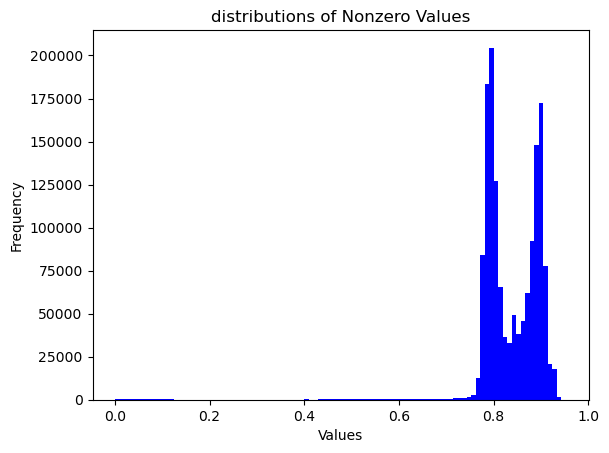

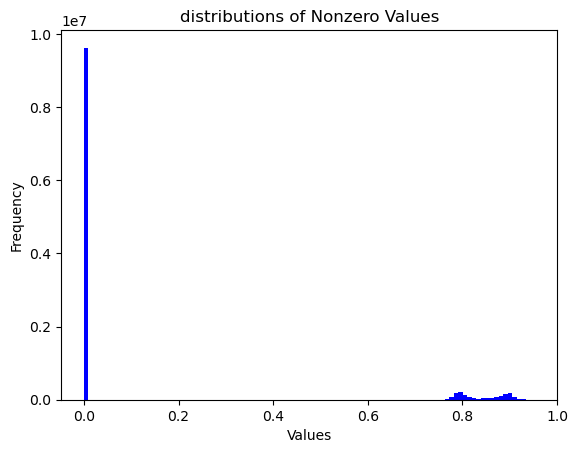

number of nonzero values = 1494482


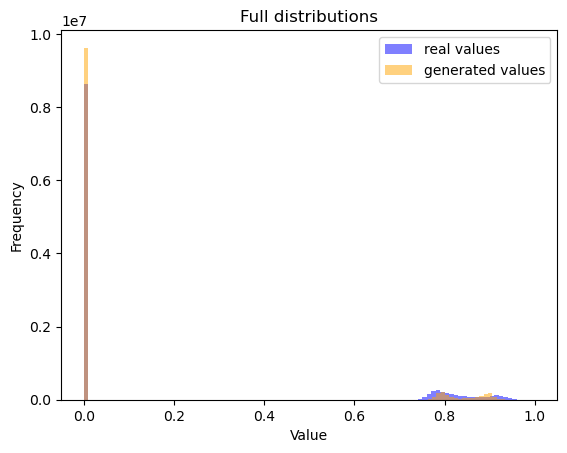

Full distribution:
KS Statistic: 0.08975201691946355
P-value: 0.0

According to regular significance level of 0.05:
The distributions are significantly different (reject H0)

According to large sample significance level of 0.05, giving significance level of 0.0006:
The distributions are significantly different (reject H0), KS statistic 0.0898 > 0.0006


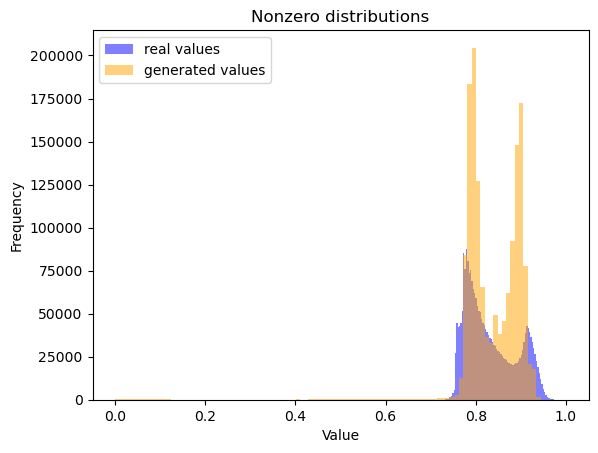

Nonzero distribution:
KS Statistic: 0.13717257422062032
P-value: 0.0

According to regular significance level of 0.05:
The distributions are significantly different (reject H0)

According to large sample significance level of 0.05, giving significance level of 0.0014:
The distributions are significantly different (reject H0), KS statistic 0.1372 > 0.0014


In [2]:

original = "data/dataset_distlognorm_massnorm.pt"
gen = "diffusion_notebook/latent_diffusion/mlp/latent_diffusion_images_mlp.pt"

generated_data, consistant, inconsistant = analyze_data(gen, original)



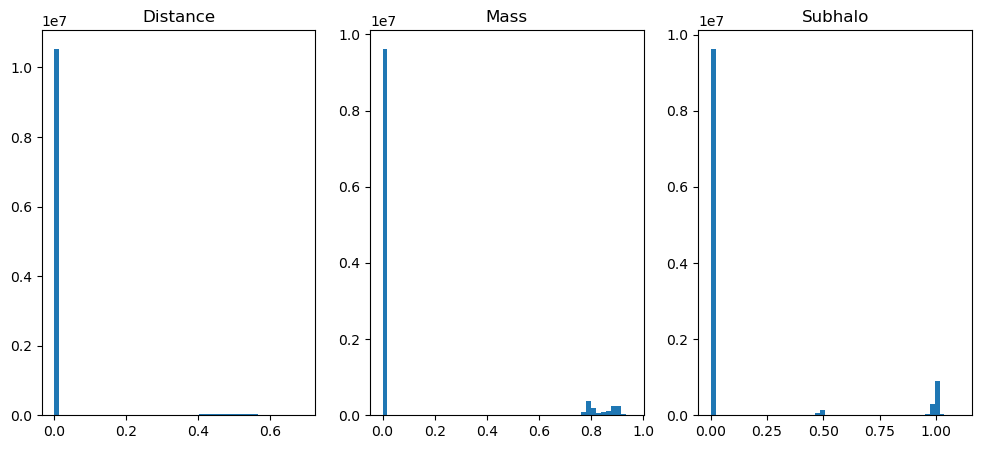

In [5]:
latent_mlp = torch.load("diffusion_notebook/latent_diffusion/mlp/latent_diffusion_images_mlp.pt", map_location = "cpu")

dist = latent_mlp[:, 0]
mass = latent_mlp[:, 1]
subh = latent_mlp[:, 2]

fig, axs = plt.subplots(1, 3, figsize=(12, 5))

# Display the first image in the first subplot
axs[0].hist(dist.numpy().flatten(), bins = 50)
axs[0].set_title('Distance')

# Display the second image in the second subplot
axs[1].hist(mass.numpy().flatten(), bins = 50)
axs[1].set_title('Mass')

# Display the second image in the second subplot
axs[2].hist(subh.numpy().flatten(), bins = 50)
axs[2].set_title('Subhalo')

plt.show()


In [6]:
# dist
print("dist:")
lower_threshold = 0.2
upper_threshold = 0.26
count_between_thresholds = torch.sum((dist > lower_threshold) & (dist < upper_threshold)).item()
total_elements = dist.numel()
percentage_between_thresholds = (count_between_thresholds / total_elements) * 100
print(f"Percentage of values between {lower_threshold} and {upper_threshold}: {percentage_between_thresholds:.2f}%\n")

print("mass:")
lower_threshold = 0.1
upper_threshold = 0.69
count_between_thresholds = torch.sum((mass > lower_threshold) & (mass < upper_threshold)).item()
total_elements = mass.numel()
percentage_between_thresholds = (count_between_thresholds / total_elements) * 100
print(f"Percentage of values between {lower_threshold} and {upper_threshold}: {percentage_between_thresholds:.2f}%\n")

print("subh:")
lower_threshold = 0.05
upper_threshold = 0.35
count_between_thresholds = torch.sum((subh > lower_threshold) & (subh < upper_threshold)).item()
total_elements = subh.numel()
percentage_between_thresholds = (count_between_thresholds / total_elements) * 100
print(f"Percentage of values between {lower_threshold} and {upper_threshold}: {percentage_between_thresholds:.2f}%\n")
lower_threshold = 0.65
upper_threshold = 0.85
count_between_thresholds = torch.sum((subh > lower_threshold) & (subh < upper_threshold)).item()
total_elements = subh.numel()
percentage_between_thresholds = (count_between_thresholds / total_elements) * 100
print(f"Percentage of values between {lower_threshold} and {upper_threshold}: {percentage_between_thresholds:.2f}%\n")


dist:
Percentage of values between 0.2 and 0.26: 0.01%

mass:
Percentage of values between 0.1 and 0.69: 0.10%

subh:
Percentage of values between 0.05 and 0.35: 0.03%

Percentage of values between 0.65 and 0.85: 0.07%



In [7]:

latent_mlp = transform_diffusion_image(latent_mlp, d_thresh = 0.23, m_tresh = 0.6, s_low = 0.3, s_high = 0.77)

original_min = 0.6985
mass = latent_mlp[:, 1]
nonzero_indices = torch.nonzero(mass.flatten())
nonzero_mass = mass.flatten()[nonzero_indices[:, 0]]
print("mass:")
count_between_thresholds = torch.sum(nonzero_mass < original_min).item()
total_elements = mass.numel()
percentage_between_thresholds = (count_between_thresholds / total_elements) * 100
print(f"Percentage of values below {original_min}: {percentage_between_thresholds:.2f}%\n")

mass:
Percentage of values below 0.6985: 0.04%



In [8]:
latent_mlp = torch.load("diffusion_notebook/latent_diffusion/mlp/latent_diffusion_images_mlp.pt", map_location = "cpu")

latent_mlp = transform_diffusion_image(latent_mlp, d_thresh = 0.3, m_tresh = 0.5, s_low = 0.3, s_high = 0.72)
full_evaluation(latent_mlp, dataset)

Analyzing generated merger tree dataset ...

			 CONSISTENCY CHECK


Percentage of consistant images = 54.03%



Inconsistency reasons:
inconsistency due to zero / nonzero mistake = 39.94%
inconsistency due to distance not zero in main branch =  0.00%
inconsistency due to gap between branches =  62.26%
inconsistency due to zgap in branch 23.21%
inconsistency due to last descendant dont exist 0.00%

Number of images with two or more inconsistencies = 4054, which is  23.00%
That corresponds to 10.57% of all images


Of all images, 18.36% have zero inconsistency
Of all images, 0.00% have distance main branch inconsistency
Of all images, 28.62% have gap between branches inconsistency
Of all images, 10.67% have gap within branch inconsistency
Of all images, 0.00% have last descendant inconsistency

			 VARIABLE CONSISTENY CHECK of consistent trees
-------------------------------------------------------------------------------------------------------
MASS:
-----------------------------------

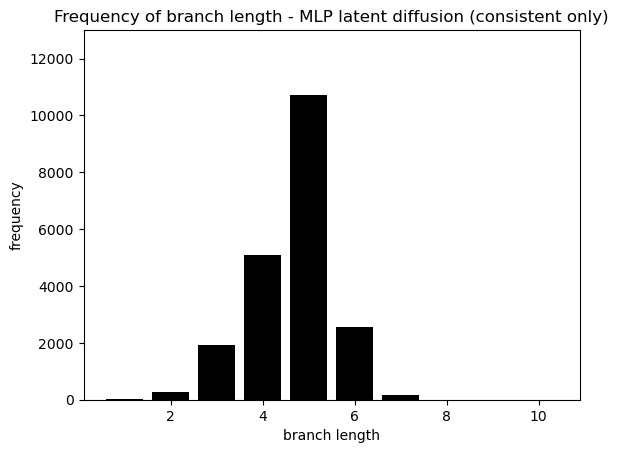

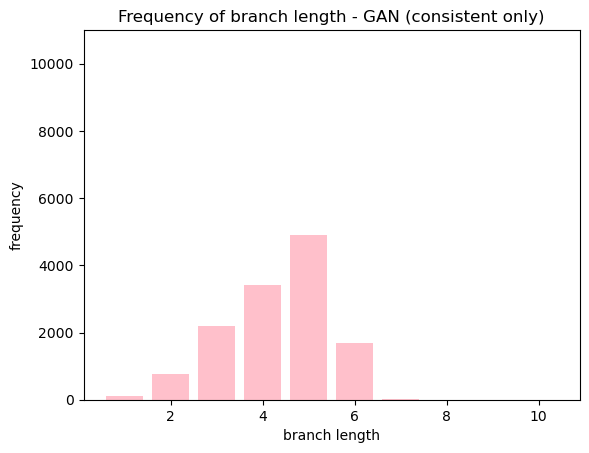

In [5]:
import matplotlib.pyplot as plt

num_branches = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
length = [24, 273, 1940, 5095, 10729, 2543, 152, 0, 0, 0]

plt.bar(num_branches, length, color = "black")

# Add title and labels
plt.title('Frequency of branch length - MLP latent diffusion (consistent only)')
plt.xlabel('branch length')
plt.ylabel('frequency')
plt.ylim([0, 13000])

plt.savefig("1")
# Show the plot
plt.show()

num_branches = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
length = [125, 759, 2206, 3405, 4910, 1688, 32, 0, 0, 0]

plt.bar(num_branches, length, color = "pink")

# Add title and labels
plt.title('Frequency of branch length - GAN (consistent only)')
plt.xlabel('branch length')
plt.ylabel('frequency')
plt.ylim([0, 11000])
plt.savefig("2")
# Show the plot
plt.show()

Real images:


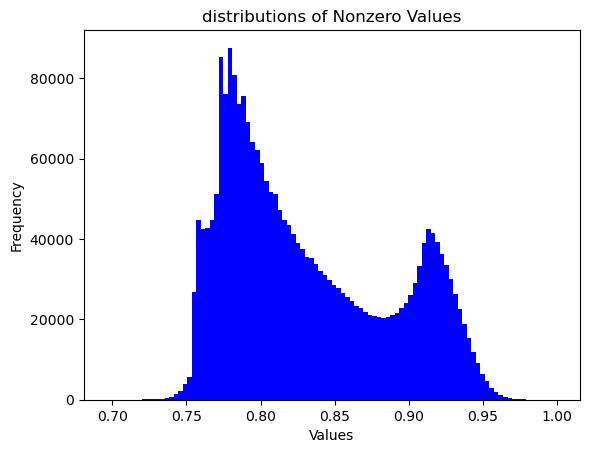

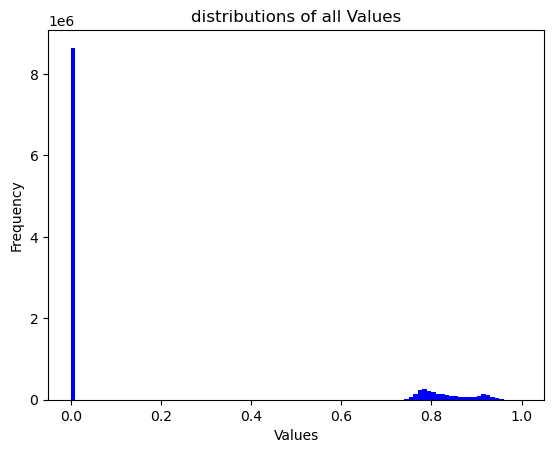

number of nonzero values = 2475374
Generated images:


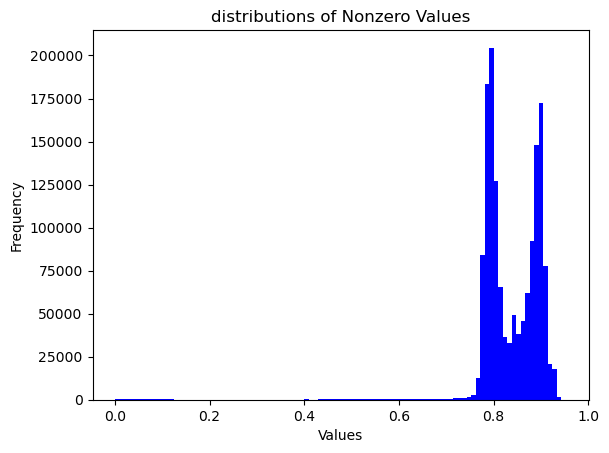

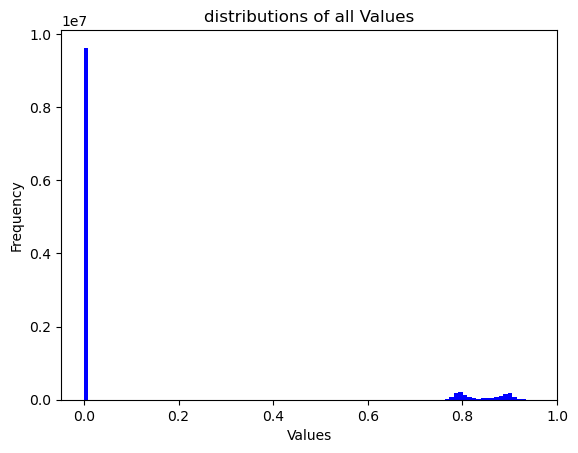

number of nonzero values = 1494482


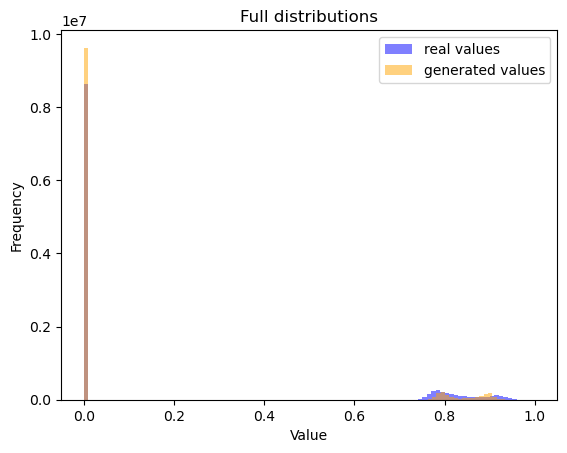

Full distribution:
KS Statistic: 0.08975201691946355
P-value: 0.0

According to regular significance level of 0.05:
The distributions are significantly different (reject H0)

According to large sample significance level of 0.05, giving significance level of 0.0006:
The distributions are significantly different (reject H0), KS statistic 0.0898 > 0.0006


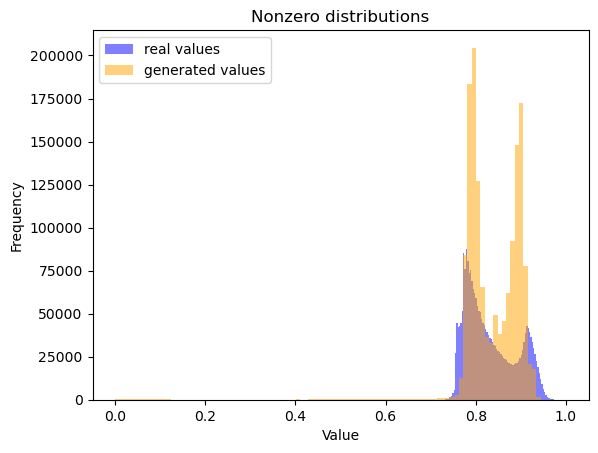

Nonzero distribution:
KS Statistic: 0.13717257422062032
P-value: 0.0

According to regular significance level of 0.05:
The distributions are significantly different (reject H0)

According to large sample significance level of 0.05, giving significance level of 0.0014:
The distributions are significantly different (reject H0), KS statistic 0.1372 > 0.0014


(0.08975201691946355, 0.13717257422062032)

In [43]:
og = torch.load("data/dataset_distlognorm_massnorm.pt")
ks_test(og, latent_mlp, dim = 1)

In [9]:
latent_mlp = torch.load("diffusion_notebook/latent_diffusion/mlp/latent_diffusion_images_mlp.pt", map_location = "cpu")

latent_mlp = transform_diffusion_image(latent_mlp, d_thresh = 0.3, m_tresh = 0.5, s_low = 0.3, s_high = 0.72)

consistent, inconsistent = check_consistency(latent_mlp)



Percentage of consistant images = 54.03%



Inconsistency reasons:
inconsistency due to zero / nonzero mistake = 39.94%
inconsistency due to distance not zero in main branch =  0.00%
inconsistency due to gap between branches =  62.26%
inconsistency due to zgap in branch 23.21%
inconsistency due to last descendant dont exist 0.00%

Number of images with two or more inconsistencies = 4054, which is  23.00%
That corresponds to 10.57% of all images


Of all images, 18.36% have zero inconsistency
Of all images, 0.00% have distance main branch inconsistency
Of all images, 28.62% have gap between branches inconsistency
Of all images, 10.67% have gap within branch inconsistency
Of all images, 0.00% have last descendant inconsistency


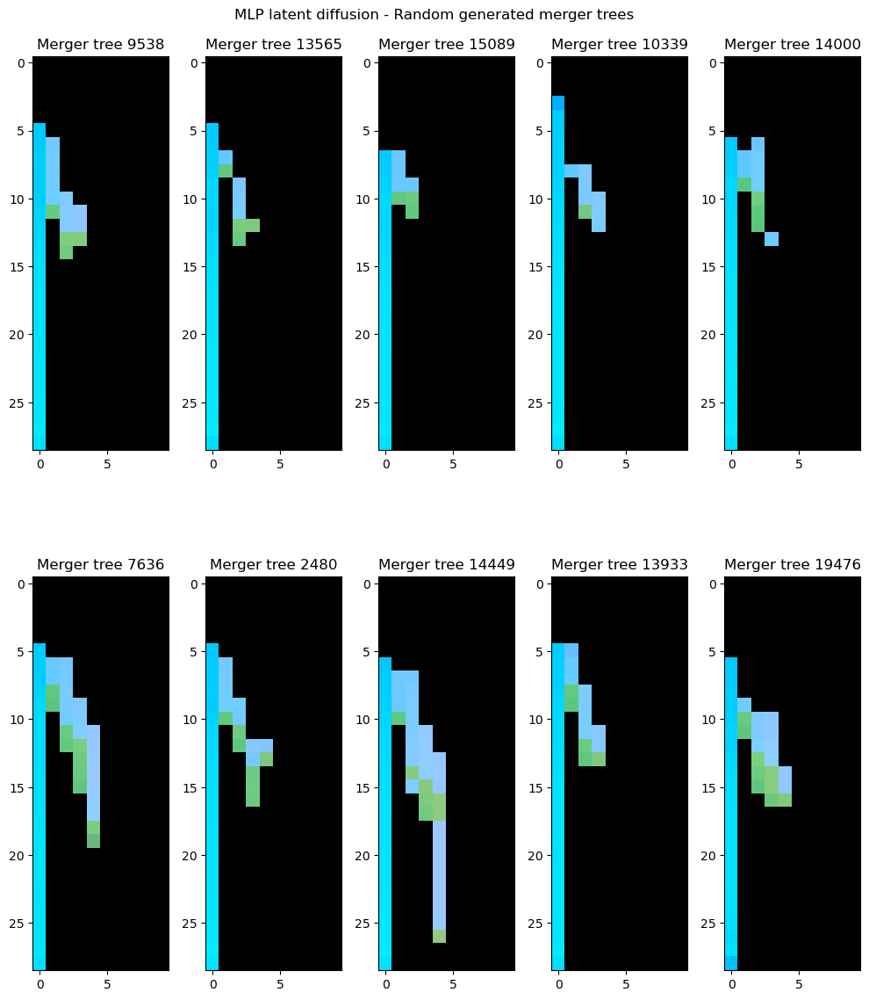

In [43]:
import random
fig, axs = plt.subplots(2, 5, figsize=(10, 12))
axs = axs.flatten()
for j in range(10):
    i = random.randint(1, 20000)
    ax = axs[j]
    ax.imshow(consistent[i+j].permute(1, 2, 0))
    ax.set_title(f'Merger tree {i}')  # Set title for each image


# Adjust spacing between subplots
plt.tight_layout()
plt.suptitle('MLP latent diffusion - Random generated merger trees')
plt.savefig("mlp")
# Show the plot
plt.show()